# Table of Contents

1. [Intro](#section-one)
 
   1.1.  [Imports](#section-1two)
   
   1.2.  [Renaming and Changing Dtype](#section-1three)

   1.3.  [Missing Value Analyze](#section-1four)
   

2.  [Exploratory Data Analysis 101](#section-two)

      2.1.[Create new vars (Season, Day& Night)](#section-2one)

      2.2. [Q1: How has crime changed over the years?](#section-2two)
       * [Q1: Analyze](#section-2two1)
       * [Q1: Answer](#section-2two2)
    
     2.3.[Q2: Is it possible to predict where or when a crime will be committed?](#section-2three)
       * [Q2: When?](#section-2threewhen)
       * [Q2: Answer](#section-2threewhenanswer)
       * [Q2: Where?](#section-2threewhere)
       * [Q2: Answer](#section-2threewhereanswer)
    
     2.4. [Q3: What can you say about the distribution of different offenses over the city?](#section-2four)
       * [Let's handle crime types](#section-2four1)
       * [Offense Code Group by districts](#section-2four2)
       * [Let's look at how the 3 most committed crimes spread to the city](#section-2four3)
       * [Let's handle shooting column](#section-2four4)
       * [General distribution of crimes with heat map](#section-2four5)
    
     2.5. [Feature Encoding](#section-2five)

     2.6. [Conclusions for Q1,Q2& Q3](#section-2six)
     

3. [Models](#section-3)

     3.1. [A. Predict crime numbers](#section-3A)
      * [A.1. Prepare for model](#section-3A1)
      * [A.2.Model 1: Predict crime numbers for each day (Base-model)](#section-3A2)
      * [A.3.Model 2: Predict crime numbers for each day for Ucr Part 3](#section-3A3)
      
   3.2. [B. Predict district](#section-3B)
      * [B.1. Prepare for model](#section-3B1)
     
         
 


![Boston1](https://images.unsplash.com/photo-1506551907304-60bb62ffc9b0?ixlib=rb-1.2.1&ixid=eyJhcHBfaWQiOjEyMDd9&auto=format&fit=crop&w=1350&q=80)

<a id="section-one"></a>

# Intro

The aim of this study is to examine how crimes have changed over the years, whether it is possible to predict where and when a crime will be committed, and the distribution of crimes across the city. Crimes in Boston data were used in the study. Data contains information about the crime such as date, location, crime group, crime code.

**Features:**

**INCIDENT_NUMBER:** The id of the crime committed. It is unique value for each crime.

**OFFENSE_CODE:** It shows code of crime types.

**OFFENSE_CODE_GROUP:** General crime types.

**OFFENSE_DESCRIPTION:** Detailed explanation of the crime.

**DISTRICT:** District name where the crime occurred.

**REPORTING_AREA:** Area number that crime reported.

**SHOOTING:** It shows with 'Y',  if the crime included shooting.

**OCCURRED_ON_DATE:** the date& time that crime occured.

**YEAR:** the year that crime occured. (2015,2016,2017,2018)

**MONTH:** the month that crime occured.

**DAY OF WEEK:** the week that crime occured.

**HOUR:** the hour that crime occured.

**UCR_PART:** Uniform Crime Reporting Offence types. Part 1 contains the most dangerous and important crimes.

**STREET:** the street  where crime occured.

**LAT:**  the latitude where the crime occurred.

**LONG:**  the longitude where the crime occurred.

**LOCATION:** the location where the crime occurred.(include latitude and longitude)

<a id="section-1two"></a>

# Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap
import pandas_profiling
import plotly.express as px

from sklearn import preprocessing
import datetime as dt    # for linear reg.

from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn import metrics
#from sklearn.metrics import r2_score,mean_squared_error
from sklearn.ensemble import RandomForestRegressor


In [2]:
data = pd.read_csv("../input/crimes-in-boston/crime.csv", encoding = "latin1")

In [3]:
# data.profile_report()  
#It takes a lot of time, don't run it each time

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319073 entries, 0 to 319072
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   INCIDENT_NUMBER      319073 non-null  object 
 1   OFFENSE_CODE         319073 non-null  int64  
 2   OFFENSE_CODE_GROUP   319073 non-null  object 
 3   OFFENSE_DESCRIPTION  319073 non-null  object 
 4   DISTRICT             317308 non-null  object 
 5   REPORTING_AREA       319073 non-null  object 
 6   SHOOTING             1019 non-null    object 
 7   OCCURRED_ON_DATE     319073 non-null  object 
 8   YEAR                 319073 non-null  int64  
 9   MONTH                319073 non-null  int64  
 10  DAY_OF_WEEK          319073 non-null  object 
 11  HOUR                 319073 non-null  int64  
 12  UCR_PART             318983 non-null  object 
 13  STREET               308202 non-null  object 
 14  Lat                  299074 non-null  float64
 15  Long             

In [5]:
print(data.isnull().sum(), end = '\n\n')
print(data[(data['Lat'].isnull()) | (data['Long'].isnull())]['Location'].unique())

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP          0
OFFENSE_DESCRIPTION         0
DISTRICT                 1765
REPORTING_AREA              0
SHOOTING               318054
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART                   90
STREET                  10871
Lat                     19999
Long                    19999
Location                    0
dtype: int64

['(0.00000000, 0.00000000)']


Lat and Long columns produce the Location column. But like the others, Location has no null values. When we print the unique values Location has for Lat or Long being null, we can see that the value was given 0 which also is kind of null for Location. So we we can accept it null.

In [6]:
data.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319073 entries, 0 to 319072
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   INCIDENT_NUMBER      319073 non-null  object 
 1   OFFENSE_CODE         319073 non-null  int64  
 2   OFFENSE_CODE_GROUP   319073 non-null  object 
 3   OFFENSE_DESCRIPTION  319073 non-null  object 
 4   DISTRICT             317308 non-null  object 
 5   REPORTING_AREA       319073 non-null  object 
 6   SHOOTING             1019 non-null    object 
 7   OCCURRED_ON_DATE     319073 non-null  object 
 8   YEAR                 319073 non-null  int64  
 9   MONTH                319073 non-null  int64  
 10  DAY_OF_WEEK          319073 non-null  object 
 11  HOUR                 319073 non-null  int64  
 12  UCR_PART             318983 non-null  object 
 13  STREET               308202 non-null  object 
 14  Lat                  299074 non-null  float64
 15  Long             

In [8]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
OFFENSE_CODE,319073.0,2317.546956,1185.285543,111.000000,1001.000000,2907.000000,3201.000000,3831.000000
YEAR,319073.0,2016.560586,0.996344,2015.000000,2016.000000,2017.000000,2017.000000,2018.000000
MONTH,319073.0,6.609719,3.273691,1.000000,4.000000,7.000000,9.000000,12.000000
HOUR,319073.0,13.118205,6.294205,0.000000,9.000000,14.000000,18.000000,23.000000
Lat,299074.0,42.214381,2.159766,-1.000000,42.297442,42.325538,42.348624,42.395042
Long,299074.0,-70.908272,3.493618,-71.178674,-71.097135,-71.077524,-71.062467,-1.000000


<a id="section-1three"></a>

# Renaming and Changing Dtype

In the beginning, we renamed our columns for clarity.


In [9]:
# rename columns
data.rename(columns = {"INCIDENT_NUMBER": "Incident_Number", 
                     "OFFENSE_CODE":"Offense_Code","OFFENSE_CODE_GROUP":"Offense_Code_Group","OFFENSE_DESCRIPTION":"Offense_Description",
                     "DISTRICT": "District","REPORTING_AREA": "Reporting_Area","SHOOTING": "Shooting",
                     "OCCURRED_ON_DATE": "Occurred_On_Date","YEAR": "Year","MONTH": "Month",
                     "DAY_OF_WEEK": "Day_Of_Week","HOUR": "Hour","UCR_PART": "Ucr_Part",
                     "STREET": "Street"
                     }, 
                                 inplace = True) 

We convert the Occurred_On_Date feature from datetime to date. Because we will handle the dates in our study.

In [10]:
data["Occurred_On_Date"] = data["Occurred_On_Date"].apply(pd.to_datetime, errors='coerce')
data["Occurred_On_Date"] = data["Occurred_On_Date"].dt.date

In [11]:
data["Occurred_On_Date"] = data["Occurred_On_Date"].apply(pd.to_datetime, errors='coerce')

<a id="section-1four"></a>

# Missing Value Analyze

* Let's see how much of the data is null. 99% of the Shooting column consists of null values. Assuming these mean no, we can replace it with N. (Yes = there is shooting, No = no shooting)
* Also, 0.06% of the Lat and Long values are missing. Since we have a small number of null values compared to our data, we can remove them. 
* Let's remove the remaining missing values from our data.

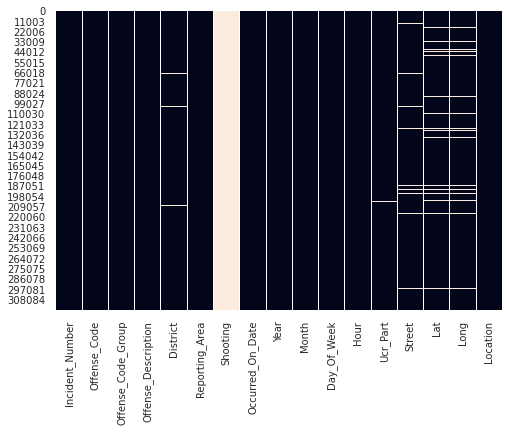

In [12]:
sns.heatmap(data.isnull(), cbar=False)

In [13]:
#missing data
total = data.isnull().sum().sort_values(ascending=False)
percent = (data.isnull().sum()/data.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(8)

,Total,Percent
Shooting,318054,0.996806
Lat,19999,0.062678
Long,19999,0.062678
Street,10871,0.034071
District,1765,0.005532
Ucr_Part,90,0.000282
Location,0,0.000000
Reporting_Area,0,0.000000


We filled in the  null-values in the Shooting column with N. Because we assumed nulls were not shooting.

In [14]:
data.Shooting.fillna('N', inplace=True)

We removed the remaining Null/NaN  values. Because it was a small part of the crime data set.

In [15]:
# 319073 entriesden 296573' a düştü.
data=data.dropna()

<a id="section-two"></a>
# Exploratory Data Analysis 101

In [16]:
data.columns

Index(['Incident_Number', 'Offense_Code', 'Offense_Code_Group',
       'Offense_Description', 'District', 'Reporting_Area', 'Shooting',
       'Occurred_On_Date', 'Year', 'Month', 'Day_Of_Week', 'Hour', 'Ucr_Part',
       'Street', 'Lat', 'Long', 'Location'],
      dtype='object')

Let's group them together to see how many unique Offense_Code there are for each Offense_Code_Group. For example, Drug Violation Offense_Code_Group  has 26 Offense_Code underneath it

In [17]:
off_code = data.groupby('Offense_Code_Group')['Offense_Code'].nunique().sort_values(ascending = False)
off_code.to_frame().reset_index()

,Offense_Code_Group,Offense_Code
0,Drug Violation,26
1,Other,21
2,Larceny,13
3,Motor Vehicle Accident Response,11
4,Robbery,10
...,...,...
58,Harassment,1
59,Harbor Related Incidents,1
60,Homicide,1
61,Investigate Person,1


Ucr Part is the most general category that defines crimes. UCR is published by the FBI and  stands for uniform crime reports. UCR Part 1 represents the most important/dangerous crimes.

In [18]:
print(data["Ucr_Part"].unique())

['Part One' 'Part Two' 'Part Three' 'Other']


<a id="section-2one"></a>
# Create new vars (Season, Day& Night)

**Seasons**

We have years and months in our data, but we create the seasons column to see seasonality.

In [19]:
def getSeason(month):
    if (month == 12 or month == 1 or month == 2):
       return "Winter"
    elif(month == 3 or month == 4 or month == 5):
       return "Spring"
    elif(month ==6 or month==7 or month == 8):
       return "Summer"
    else:
       return "Fall"

In [20]:
data['Season'] = data.Month.apply(getSeason)

**Day & Night**

In [21]:
data['Day'] = 0
data['Night'] = 0
# Day or night for 1st month
data['Day'].loc[(data['Hour'] >= 6) & (data['Hour'] <= 18)] = 1

/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [22]:
data['Night'].loc[data['Day']==0]=1

/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


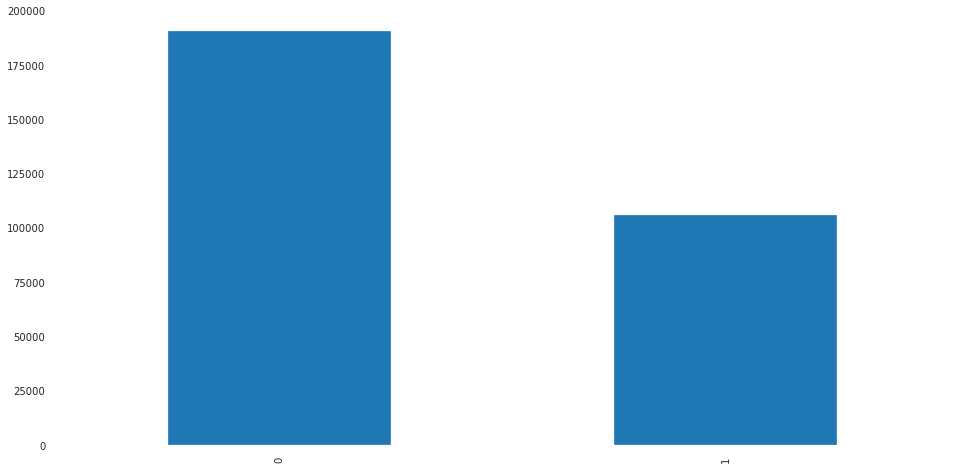

In [23]:
plt.figure(figsize=(16,8))
data['Night'].value_counts().plot.bar()
plt.show()

<a id="section-2two"></a>
# Q1: How has crime changed over the years?

<a id="section-2two1"></a>
## Q1: Analyze

* **Crime counts per year**

In the chart below, we see the sums of the number of crimes committed each year. Could crime have increased this much in 2016 and 2017? It looks a little odd.

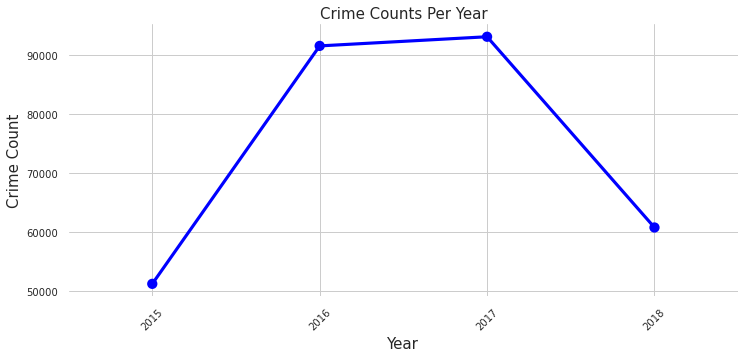

In [24]:
year_count = []

for i in data.Year.unique():
    year_count.append(len(data[data['Year']==i]))

plt.figure(figsize=(12,5))
sns.pointplot(x=data.Year.unique(),y=year_count,color='blue',alpha=0.8)
plt.xlabel('Year',fontsize = 15)
plt.xticks(rotation=45)
plt.ylabel('Crime Count',fontsize = 15)
plt.title('Crime Counts Per Year',fontsize = 15)
plt.grid()
plt.show()

When we look at the distribution of the crime over the years, we see that there were more crimes in 2016 and 2017 than in other years. Let's look in more detail to understand the reason for this. We may have missing data.

Text(0.5, 1.0, 'Number Of Crimes Each Year')

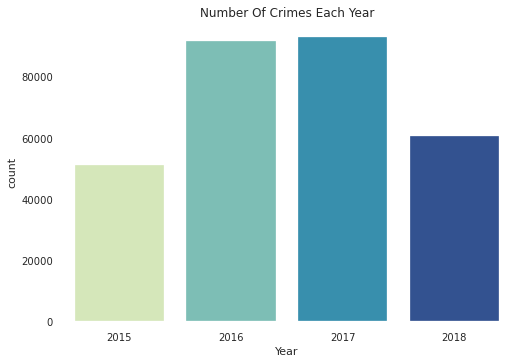

In [25]:
sns.countplot(data=data, x="Year",palette='YlGnBu')
plt.title('Number Of Crimes Each Year')

* **Number Of Crimes Each Season**

According to the graph below, we see an increase in crime during the summer season. Is there seasonality in crimes?
The answer is in the Crimes by Month of Year graph. During the summer months, data were entered for all years, so it is normal to see more crime in these months. This does not mean seasonality.


Text(0.5, 1.0, 'Number Of Crimes Each Season')

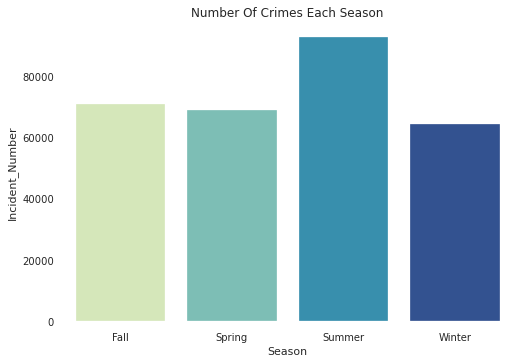

In [26]:
season_counts = data.groupby('Season').count()['Incident_Number'].to_frame().reset_index()
ax = sns.barplot(x = 'Season' , y="Incident_Number", data = season_counts, palette='YlGnBu')
plt.title('Number Of Crimes Each Season')

* **Number Of Crimes Each Month**

As we can guess from the seasons, it seems more crime in June, July and August.

Text(0.5, 1.0, 'Number Of Crimes Each Month')

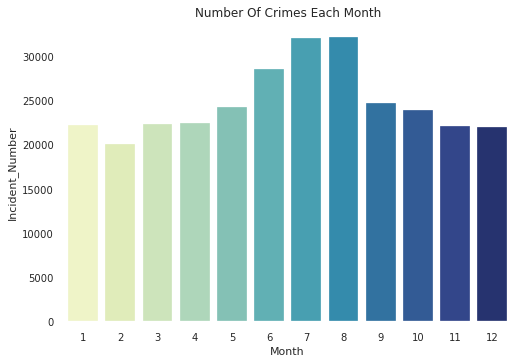

In [27]:
month_counts = data.groupby('Month').count()['Incident_Number'].to_frame().reset_index()
ax = sns.barplot(x = 'Month' , y="Incident_Number", data = month_counts, palette='YlGnBu')
plt.title('Number Of Crimes Each Month')

* **Number Of Crimes Each Day_of_Week**

More crimes were committed on Fridays, but there is not much difference between the numbers.

  Day_Of_Week  Incident_Number
0      Friday            45133
1      Monday            42469
2    Saturday            41569
3      Sunday            37677
4    Thursday            43283
5     Tuesday            42997
6   Wednesday            43445


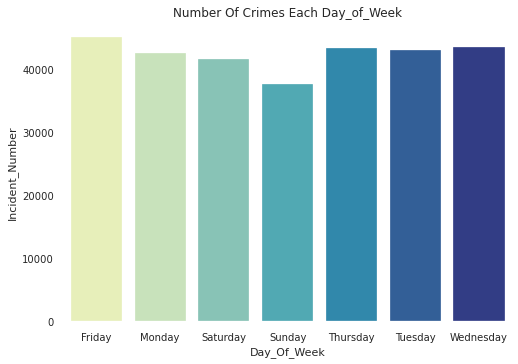

In [28]:
day_counts = data.groupby('Day_Of_Week').count()['Incident_Number'].to_frame().reset_index()
ax = sns.barplot(x = 'Day_Of_Week' , y="Incident_Number", data = day_counts, palette='YlGnBu')
plt.title('Number Of Crimes Each Day_of_Week')
print(day_counts)

* **Crimes by Month of Year**

Text(0.5, 1.0, 'Crime counts per year and month')

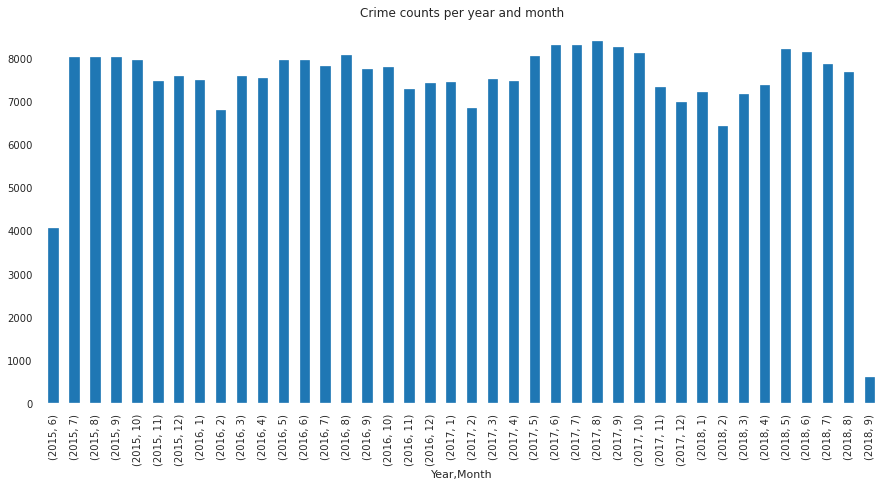

In [29]:
plt.figure(figsize=(15,7))
data.groupby(['Year','Month']).count()['Incident_Number'].plot.bar()
plt.title('Crime counts per year and month')

According to the chart below, we do not have data for the first 5 months of 2015 and the last 3 months of 2018. When we look at the number of crimes committed by years, we see that there were fewer crimes in 2015 and 2018 for this reason.

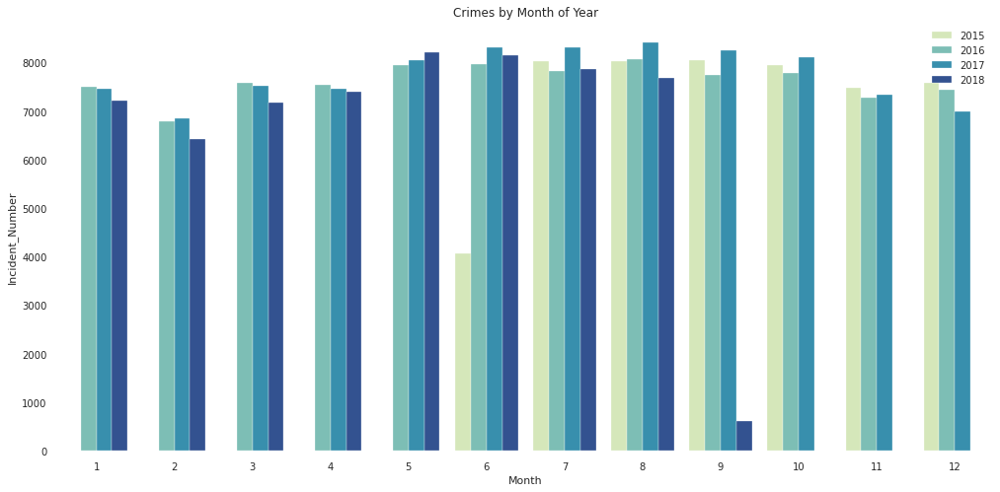

In [30]:
fig, ax = plt.subplots(figsize=(17,8))
# with sns.color_palette("RdGy", 10):
montyearAggregated = pd.DataFrame(data.groupby(["Month","Year"])["Incident_Number"].count()).reset_index()
a=sns.barplot(data=montyearAggregated,x="Month", y="Incident_Number",hue = 'Year', palette='YlGnBu')
a.set_title("Crimes by Month of Year",fontsize=12)
plt.legend(loc='upper right')
plt.show()

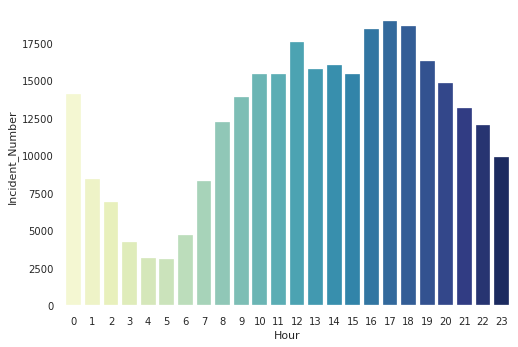

In [31]:
hour_nums = data.groupby(['Hour']).count()['Incident_Number'].to_frame().reset_index()
ax = sns.barplot(x = 'Hour' , y="Incident_Number", data = hour_nums,  palette='YlGnBu')

<a id="section-2two2"></a>

## Q1: Answer

Let's look at the years by filtering only the months for which data were entered in all months. In the "Crime Amount by Year" graph (in question 2) , we can see that the average of the crime amounts is closer. We must pay attention to the missing months to avoid making wrong assumptions.

**Incıdent Number**

/opt/conda/lib/python3.7/site-packages/seaborn/categorical.py:3695: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


<Figure size 576x576 with 0 Axes>

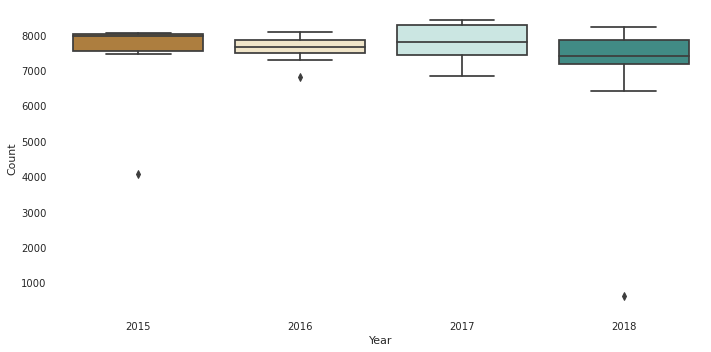

In [32]:
df_year_new=data.groupby(["Year","Month"])["Incident_Number"].count().reset_index()
df_year_filter=df_year_new[~df_year_new['Month'].isin(['1','2','3','4','5','11','12'])]
fig = plt.figure(figsize=(8,8))
with sns.color_palette("BrBG",4):
    ctplt2=sns.catplot(x="Year", y="Incident_Number",kind="box", data=df_year_new,size=5, aspect=2)
    plt.ylabel('Count')
    plt.show();

Year
2015    51187
2016    91545
2017    93097
2018    60744
Name: Incident_Number, dtype: int64


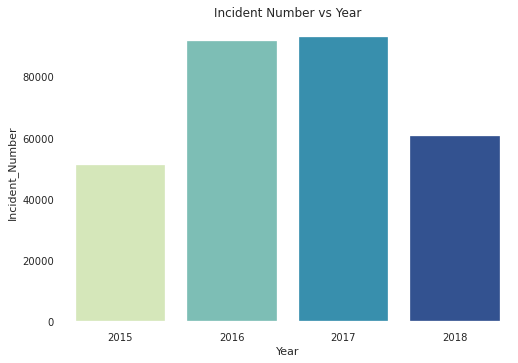

In [33]:
plt.title('Incident Number vs Year')
year_counts = data.groupby('Year').count()['Incident_Number'].to_frame().reset_index()
print(data.groupby('Year').count()['Incident_Number'])
ax = sns.barplot(x = 'Year' , y="Incident_Number", data = year_counts, palette='YlGnBu')

In [34]:
print('Count of Months Per Year:\n',data.groupby('Year')['Month'].nunique())
av_month = (data.groupby('Year').count()['Incident_Number'] / data.groupby('Year')['Month'].nunique()).to_frame().reset_index()

print('\nAverage monthly incident per year:\n',av_month)
av_month.rename(columns = {0:'Incident_n-Number'}, inplace = True)


Count of Months Per Year:
 Year
2015     7
2016    12
2017    12
2018     9
Name: Month, dtype: int64

Average monthly incident per year:
    Year            0
0  2015  7312.428571
1  2016  7628.750000
2  2017  7758.083333
3  2018  6749.333333


We see that average daily casesare quite close to each other. The daily average increases a couple of incidents from 2015 to 2016 and increase a couple from 2016 to 2017 as well while there is around 7 incident decrease from 2017 to 2018.

Let's consider our data on a daily basis to make the most accurate assumptions.

In [35]:
print("Min date:  ", data.min()['Occurred_On_Date'])
print("Max date:  ", data.max()['Occurred_On_Date'])
print("--------------------------------------------")
data['Occurred_On_Date'] = pd.to_datetime(data['Occurred_On_Date'])
yearly_counts = data.groupby('Year').count()['Incident_Number'].to_numpy()
days = [(data[data['Year'] == year].Occurred_On_Date.max() - data[data['Year'] == year].Occurred_On_Date.min()).days for year in data.Year.sort_values().unique()]
average_daily_incidents = yearly_counts/days
print("Average Daily Crimes:  ")
print([str(year)+": "+str(avg)[:4] for year, avg in enumerate(average_daily_incidents, 2015)])

Min date:   2015-06-15 00:00:00
Max date:   2018-09-03 00:00:00
--------------------------------------------
Average Daily Crimes:  
['2015: 257.', '2016: 250.', '2017: 255.', '2018: 247.']


[Text(0, 0, '2015'),
 Text(0, 0, '2016'),
 Text(0, 0, '2017'),
 Text(0, 0, '2018')]

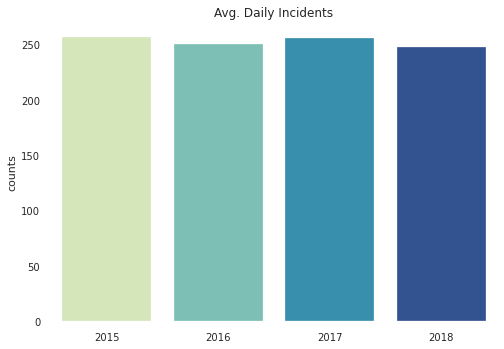

In [36]:
d_avg = pd.DataFrame(data = average_daily_incidents, index = av_month.index)
d_avg.rename(columns = {0:'counts'}, inplace = True)
plt.title('Avg. Daily Incidents')

ax = sns.barplot(x = d_avg.index , y="counts", data = d_avg,palette='YlGnBu' )
ax.set_xticklabels(data.Year.sort_values().unique())

**Weekend vs. Weekday**

As seen in the graphs below, there is no significant difference in the number of cases on weekdays and weekends.

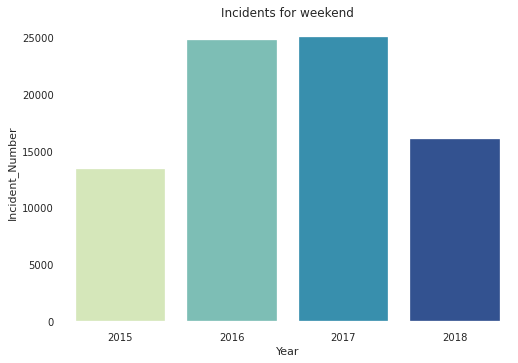

In [37]:
weekend = data[(data['Day_Of_Week'] == 'Saturday') | (data['Day_Of_Week'] == 'Sunday')]
weekday = data[(data['Day_Of_Week']!= 'Saturday') & (data['Day_Of_Week'] != 'Sunday')]

weekday_year = weekday.groupby('Year').count()['Incident_Number'].to_frame()
weekend_year = weekend.groupby('Year').count()['Incident_Number'].to_frame()
plt.title('Incidents for weekend')

ax = sns.barplot(x = weekend_year.index , y="Incident_Number", data = weekend_year,palette='YlGnBu')

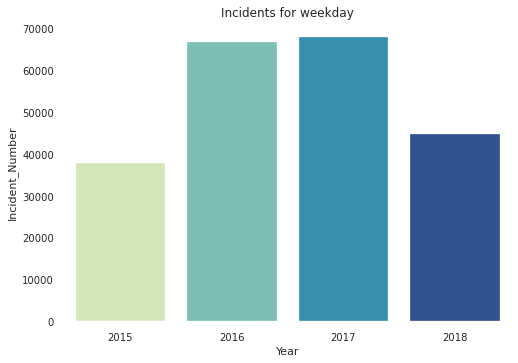

In [38]:
plt.title('Incidents for weekday')
ax = sns.barplot(x = weekday_year.index , y="Incident_Number", data = weekday_year,palette='YlGnBu')

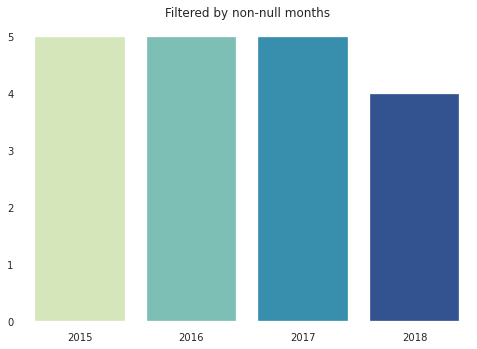

In [39]:
plt.title('Filtered by non-null months')
monthCrimes = df_year_new[~df_year_new['Month'].isin(['1','2','3','4','5','11','12'])]
yearly_counts = monthCrimes.groupby('Year').count()['Incident_Number'].to_numpy()
ax = sns.barplot(x = [2015, 2016, 2017, 2018] , y=yearly_counts,palette='YlGnBu')

As a result, there are months in our data with missing data. However, if we go deeper and look on a day basis, we see that there is no significant difference. We have to care about missing data in our analysis.

<a id="section-2three"></a>

# Q2: Is it possible to predict where or when a crime will be committed?

<a id="section-2threewhen"></a>
## **Q2: When?**

Text(-9.074999999999989, 0.5, 'Count')

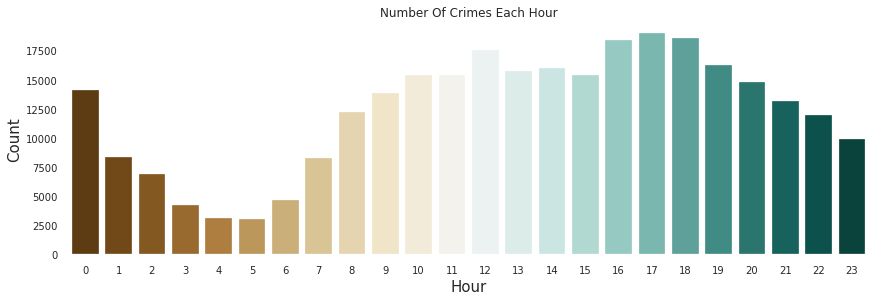

In [40]:
sns.catplot(x='Hour',
           kind='count',
            height=4, 
            aspect=3,
            palette='BrBG',
            #color='BrBG',
           data=data)
plt.title('Number Of Crimes Each Hour')
plt.xticks(size=10)
plt.yticks(size=10)
plt.xlabel('Hour', fontsize=15)
plt.ylabel('Count', fontsize=15)

In the chart above, we see that the most crimes occur around 17:00, 18:00 and 12:00. The reason for this may be that students / employees coincide with work hours and breaks. The number of crimes is likely to increase with the increasing number of people on the street.

* **Incident counts per week day per year**

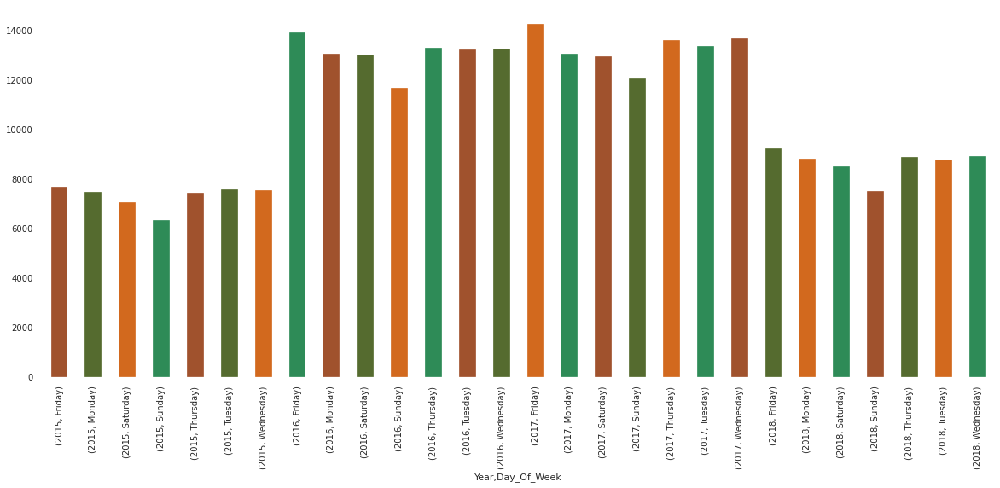

In [41]:
plt.figure(figsize=(20,8))
data.groupby(['Year','Day_Of_Week']).count()['Incident_Number'].plot.bar(color = ['sienna', 'darkolivegreen', 'chocolate', 'seagreen'])

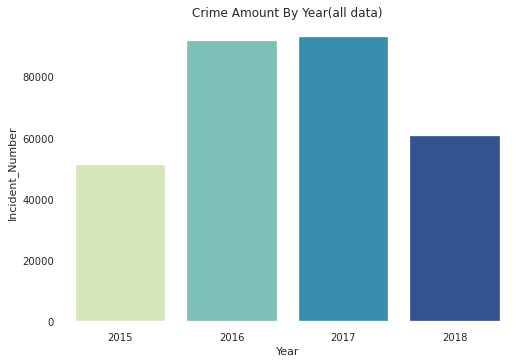

In [42]:
plt.title("Crime Amount By Year(all data)")
years = data.groupby('Year').count()['Incident_Number'].to_frame().reset_index()
ax = sns.barplot(x = 'Year' , y="Incident_Number", data = years, palette='YlGnBu')

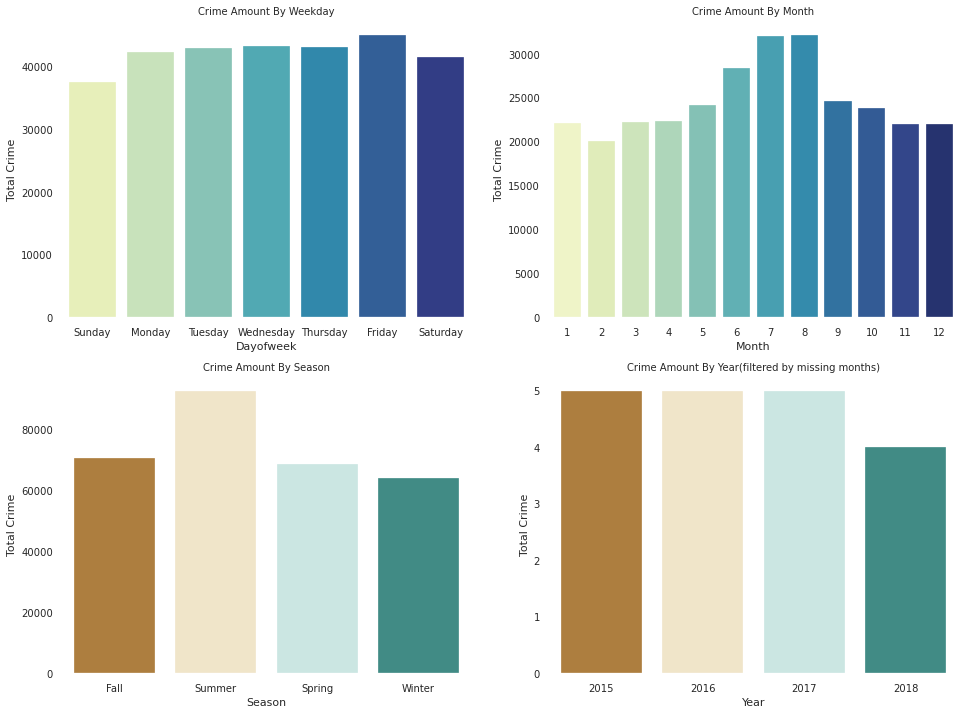

In [43]:
fig,axes= plt.subplots(2,2)
fig.set_size_inches(16,12)
with sns.color_palette('BrBG',4):
  a=sns.countplot(x="Day_Of_Week",order=['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday'],data=data,ax=axes[0, 0],palette='YlGnBu')
  a.set(xlabel='Dayofweek', ylabel='Total Crime')
  a.set_title("Crime Amount By Weekday",fontsize=10)

  b=sns.countplot(x="Month",data=data,ax=axes[0, 1],palette='YlGnBu')
  b.set(xlabel='Month', ylabel='Total Crime')
  b.set_title("Crime Amount By Month",fontsize=10)

  c=sns.countplot(x="Season",data=data,ax=axes[1, 0])
  c.set(xlabel='Season', ylabel='Total Crime')
  c.set_title("Crime Amount By Season",fontsize=10)


   
  #df_year_new=data.groupby(["Year","Month"])["Incident_Number"].count().reset_index()
  #df_year_filter=df_year_new[~df_year_new['Month'].isin(['1','2','3','4','5','11','12'])]
  d=sns.countplot(x="Year",data=df_year_filter,ax=axes[1, 1])
  d.set(xlabel='Year', ylabel='Total Crime')
  d.set(xlabel='Year', ylabel='Total Crime')
  d.set_title("Crime Amount By Year(filtered by missing months)",fontsize=10);


 * The most crimes seem to be on Friday. The months with the most crimes appear to be July and August (Crime Amount By Month chart), which coincides with the summer season in the Crime Amount By Season chart.

* When we plot again by taking only the months of data entered, we can see that the crime entries are close in the chart called Crime Amount By Year and 2018 is lower than the others.

Crimes can behave differently over the years. We can say that the  Medical Assistance crimes saw a rise over the years. We can observe a similar trend with the Investigate Person crime type.


Text(0.05, 0.95, 'Timeline of the most frequent crimes(2015-2018).')

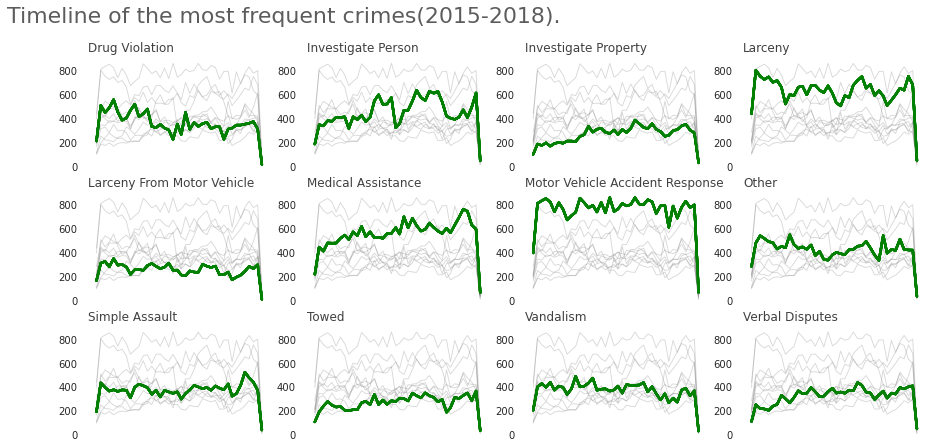

In [44]:
ten_freq_crimes = data["Offense_Code_Group"].value_counts()[:12]
df_top_crimes = data[data["Offense_Code_Group"].isin(ten_freq_crimes.index)]
df_tp = df_top_crimes.pivot_table(index=df_top_crimes["Occurred_On_Date"],
                                                      columns=["Offense_Code_Group"],aggfunc="size", fill_value=0).resample("M").sum()

#palette = plt.get_cmap('Set2')
num=0
ax,fix = plt.subplots(figsize=(15,7))
for column in df_tp:
    num+=1
    plt.subplot(3,4, num)
    for v in df_tp:
        plt.plot(df_tp.index,v,data=df_tp,marker='', color='grey', linewidth=0.9, alpha=0.3)
        plt.tick_params(labelbottom=False)
        plt.plot(df_tp.index,column, data=df_tp,color="green", linewidth=2.4, alpha=0.75, label=column)
        plt.title(column, loc='left', fontsize=12, fontweight=0, color="black", alpha=0.75)
ax.text(x=0.05,y=0.95,s="Timeline of the most frequent crimes(2015-2018).",alpha=0.75, fontsize=22)

<a id="section-2threewhenanswer"></a>
## Q2: Answer 

We can predict possible crimes based on historical data. We can use different time zones such as day and night to strengthen our forecast. I think we can try answering questions like the ones below.Methods such as classification, ARIMA and regression can be used.
* What is the time of the crime?
* How many crimes happen in an hour?
* How many crimes will happen next week?
* How many crimes occur in a particular area?

<a id="section-2threewhere"></a>
## **Q2: Where?**

* **Number Of Crimes By District**

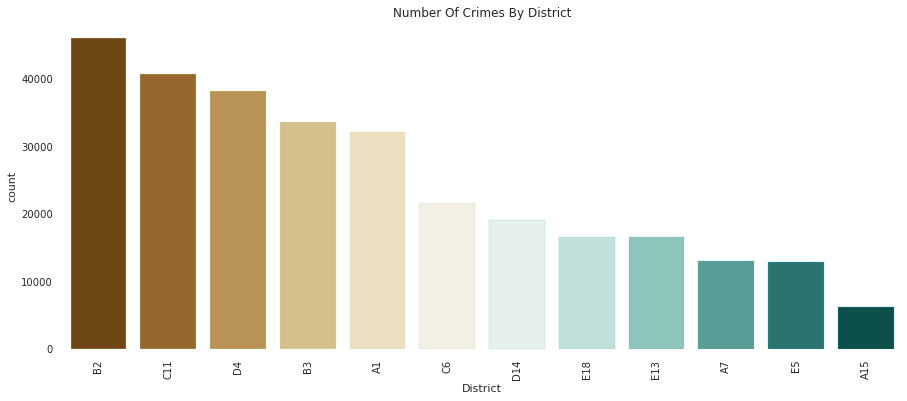

In [45]:
plt.subplots(figsize=(15,6))
sns.countplot('District',palette='BrBG',data=data,edgecolor=sns.color_palette('YlGnBu',20),order=data['District'].value_counts().index)
plt.xticks(rotation=90)
plt.title('Number Of Crimes By District')
plt.show()

From the graph above, we can say that the most crimes occur in the B2 district.

* Crime Numbers of Districts by Years

More crime appears in all districts in 2016 and 2017. It was no surprise.

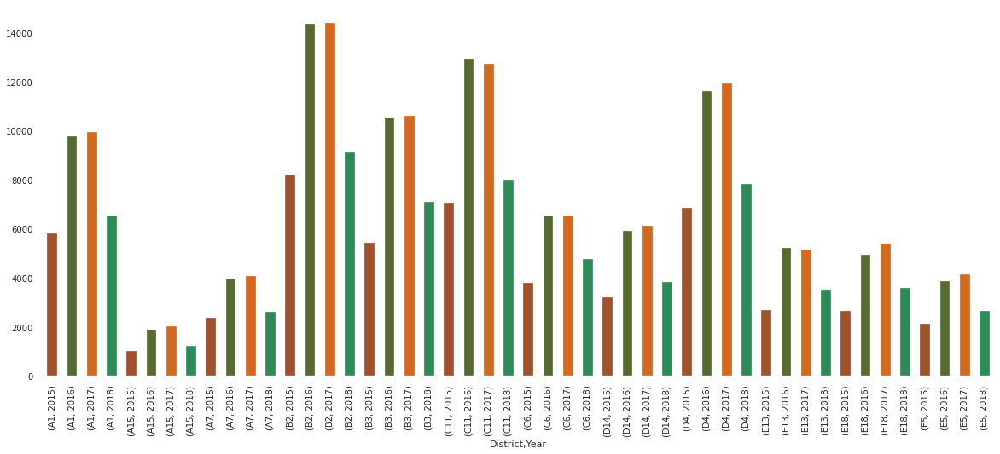

In [46]:
plt.figure(figsize=(20,8))
data.groupby(['District','Year']).count()['Incident_Number'].plot.bar(color = ['sienna', 'darkolivegreen', 'chocolate', 'seagreen'])

* **Street**

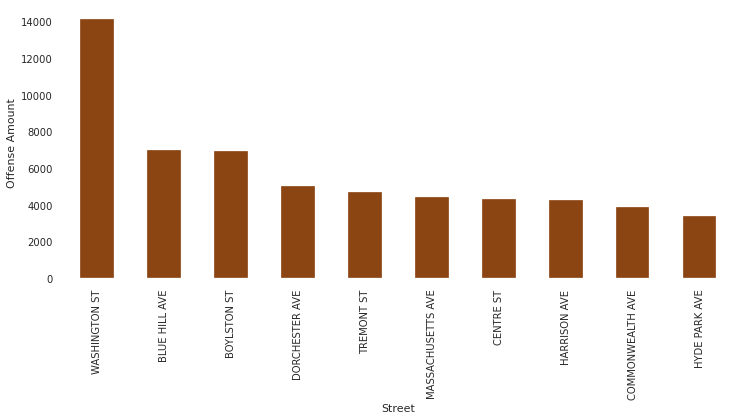

In [47]:
fig = plt.figure(figsize=(12,5))
crime_street = data.groupby('Street')['Incident_Number'].count().nlargest(10)
crime_street.plot(kind='bar', color ="saddlebrown")
plt.xlabel("Street")
plt.ylabel("Offense Amount")
plt.show()

In the plot above, we can see the streets with the most crime. According to the chart, Washington St is the street with the most crime, it is Blue Hill Ave and Boylston St. is following.

Here we see how many streets a district has.

In [48]:
(data.groupby('District')['Street'].nunique().sort_values(ascending = False).to_frame()).head()

,Street
District,
C11,605
B2,579
E5,508
E18,416
B3,403


In this graph, we can see the distribution of crimes by districts. We can interpret that theft crime was mostly seen in the D4 region, and the crimes in the motor vehicle accident group were seen in the B2 district. By looking at which time, which street, which crime was most committed in which district, etc., we can speculate on where and when the possible crimes will be committed.

* **Location**

In [49]:
((data.groupby(["Lat","Long"]).count()[['Incident_Number']]).reset_index()).head()

,Lat,Long,Incident_Number
0,-1.000000,-1.000000,152
1,42.232413,-71.129715,10
2,42.232656,-71.130700,2
3,42.232870,-71.130050,5
4,42.232907,-71.131671,3


<a id="section-2threewhereanswer"></a>
## Answer

We can guess the districts and streets. Classification will be useful here. But we have too many streets, that could be a problem.
* We can say that the most crimes occur in the B2 district.
* We can see the streets with the most crime.
* We can see how the offense code groups are distributed to districts.
* We can find crime centers with clustering method. We can use these as police stations.

<a id="section-2four"></a>

# Q3: What can you say about the distribution of different offenses over the city?

In this section, we will examine how crimes are distributed in the city. Since there are many streets and reporting arenas, we will look at the districts. We have 12 different districts.

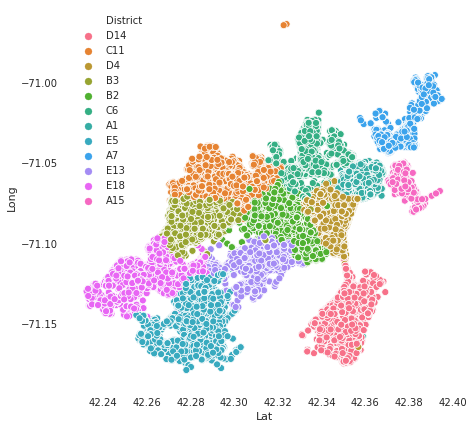

In [50]:
plt.figure(figsize=(7,7))
sp = data[(data['Lat'] != -1) & (data['Long'] != -1)]
sns.scatterplot(x="Lat", y="Long",hue='District',data=sp)

<a id="section-2four1"></a>
* **Let's handle crime types**

Q: *What are the most common crimes?*


According to the graph below, the most common crimes are motor vehicle accident and larcency.


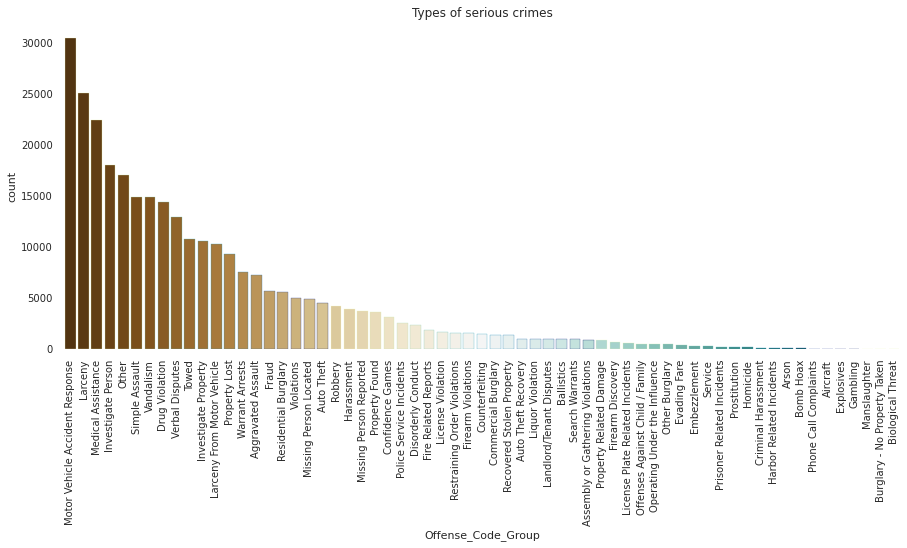

In [51]:
plt.subplots(figsize=(15,6))
sns.countplot('Offense_Code_Group',palette='BrBG',data=data,edgecolor=sns.color_palette('YlGnBu',20),order=data['Offense_Code_Group'].value_counts().index)
plt.xticks(rotation=90)
plt.title('Types of serious crimes')
plt.show()

<a id="section-2four2"></a>
* **Offense Code Group by districts**

Let's look at the relationship between Offense_Code_Group and District.
According to the graph below, the most larceny crime occurred in D4 district.

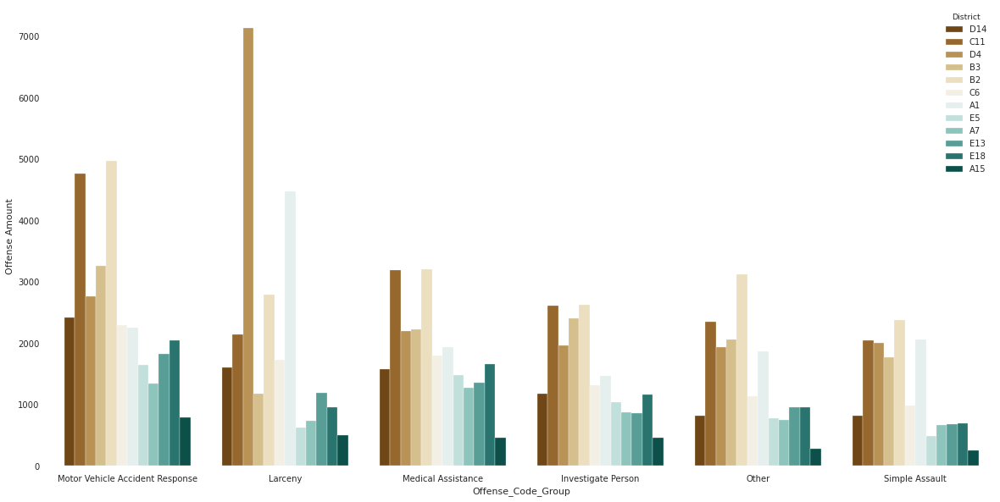

In [52]:
fig = plt.figure(figsize=(20,10))
order2 = data['Offense_Code_Group'].value_counts().head(6).index
sns.countplot(data = data, x='Offense_Code_Group',hue='District', order = order2,palette='BrBG' );
plt.ylabel("Offense Amount");

<a id="section-2four3"></a>

* **Let's look at how the 3 most committed crimes spread to the city.**

In [53]:
# import plotly.express as px
ds = data.dropna(subset = ['Lat','Long','District'])
ds = ds[ds['Offense_Code_Group'] == 'Motor Vehicle Accident Response']
location = pd.DataFrame(data =(ds.groupby(["Lat","Long"]).count()[['Incident_Number']]).reset_index().values, columns=["Lat","Long","Incident_Number"])
x,y = location['Long'], location['Lat']
fig = px.density_mapbox(location,lat="Lat",lon="Long",z="Incident_Number",radius=10,center=dict(lat=42.32475, lon=-71.076),zoom=10,mapbox_style="stamen-terrain",height=500,width=1450)
fig.show()

In [54]:
ds = data.dropna(subset = ['Lat','Long','District'])
ds = ds[ds['Offense_Code_Group'] == 'Larceny']
location = pd.DataFrame(data =(ds.groupby(["Lat","Long"]).count()[['Incident_Number']]).reset_index().values, columns=["Lat","Long","Incident_Number"])
x,y = location['Long'], location['Lat']
fig = px.density_mapbox(location,lat="Lat",lon="Long",z="Incident_Number",radius=10,center=dict(lat=42.32475, lon=-71.076),zoom=10,mapbox_style="stamen-terrain",height=500,width=1450)
fig.show()

In [55]:
ds = data.dropna(subset = ['Lat','Long','District'])
ds = ds[ds['Offense_Code_Group'] == 'Medical Assistance']
location = pd.DataFrame(data =(ds.groupby(["Lat","Long"]).count()[['Incident_Number']]).reset_index().values, columns=["Lat","Long","Incident_Number"])
x,y = location['Long'], location['Lat']
fig = px.density_mapbox(location,lat="Lat",lon="Long",z="Incident_Number",radius=10,center=dict(lat=42.32475, lon=-71.076),zoom=10,mapbox_style="stamen-terrain",height=500,width=1450)
fig.show()

<a id="section-2four4"></a>

* **Let's handle shooting column**


Q: *How is the relationship between districts and shooting?*



We can see relationship between districts and shooting like that most shooting occur in B2 district. The number of shooting is high near Dorchester ave Roxbury. We can see other cases on the map.

In [56]:
shtng = data[(data.Shooting == 'Y') & (data.District.notnull())]

import folium
import folium.plugins as plugins

latitude = list(shtng.Lat)[1] # This is to initiate the latitude start point for the map
longitude = list(shtng.Long)[1] # This is to initiate the longitude start point for the map

latitudes = list(shtng.Lat) #create the list of all reported latitudes
longitudes = list(shtng.Long) #create the list of all reported longitudes

shooting_map = folium.Map(location = [latitude, longitude], zoom_start = 12) # instantiate a folium.map object

shooting = plugins.MarkerCluster().add_to(shooting_map) # instantiate a mark cluster object for the incidents in the dataframe

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(shtng.Lat, shtng.Long, shtng.District):
    if (not np.isnan(lat)) & (not np.isnan(lng)): # also, we check a non-nullness of the coordinates
        folium.Marker(
            location=[lat, lng],
#             icon=None,
            popup=label,
            icon=folium.Icon(icon='exclamation-sign')
        ).add_to(shooting)

# display the map
shooting_map

To look at crimes committed in a specific area, a heat map can be useful. We can use latitude and longitude values.By zooming in on the map, we can see which streets and intersections are intense. By looking at the heat map, we can speculate when crimes are concentrated in the city.

<a id="section-2four5"></a>

* **General distribution of crimes with heat map**

In [57]:
# Folium crime map
crime_map = folium.Map(location=[42.3125,-71.0875], 
                      zoom_start = 13)

# yıl filtrelemek için: 
# data_heatmap = data[data.Year ==  2016]   

data_heatmap = data[['Lat','Long']]
data_heatmap = data.dropna(axis=0, subset=['Lat','Long'])
data_heatmap = [[row['Lat'],row['Long']] for index, row in data_heatmap.iterrows()]
HeatMap(data_heatmap, radius=10).add_to(crime_map)

crime_map

<a id="section-2five"></a>
# Feature Encoding

**Shooting** 

We encoded the shooting column to use it in models. We changed it to 0 if there is no shooting, and 1 if there is.

In [58]:
# if Shooting is No =  0, Yes = 1 .
def isShooting(dataFrame):
    dataFrame["Shooting"] = dataFrame["Shooting"].apply(lambda x: 1 if x == "Y" else 0)
    return dataFrame
data = isShooting(data)

**Day Of Week**

We encode days of week with mapping.

In [59]:
data["DayOfWeek"] = data["Day_Of_Week"].map({
    "Monday":1,
    "Tuesday":2,
    "Wednesday":3,
    "Thursday":4,
    "Friday":5,
    "Saturday":6,
    "Sunday":7
})

**Season**

Season names can be challenging while developing models. Instead, we will use the numbers below.
* Fall:0 
* Spring: 1 
* Summer: 2 
* Winter:3

In [60]:
# Fall:0 , Spring: 1 , Summer: 2 , Winter:3
le = preprocessing.LabelEncoder()
data['Seasons'] = le.fit_transform(data['Season'])

In [61]:
data = data.drop("Season", axis = 1)

**Ucr Parts**

In [62]:
# 'Part One', 'Part Three', 'Part Two', 'Other' lerin anlamlı olarak değişmesini istediğim için label encodingle değil mapleyerek oluşturdum.
data["Ucr_Parts"] = data["Ucr_Part"].map({
    "Part One":1,
    "Part Two":2,
    "Part Three":3,
    "Other":0
})

In [63]:
data = data.drop("Ucr_Part", axis = 1)

In [64]:
data.columns

Index(['Incident_Number', 'Offense_Code', 'Offense_Code_Group',
       'Offense_Description', 'District', 'Reporting_Area', 'Shooting',
       'Occurred_On_Date', 'Year', 'Month', 'Day_Of_Week', 'Hour', 'Street',
       'Lat', 'Long', 'Location', 'Day', 'Night', 'DayOfWeek', 'Seasons',
       'Ucr_Parts'],
      dtype='object')

In [65]:
# sort
data = data.sort_values(by =['Occurred_On_Date'], ascending=False)
data[[  'District', 'Shooting','Occurred_On_Date', 'Year', 'Month', 'Day_Of_Week', 'Hour',  'Night', 'DayOfWeek', 'Seasons','Ucr_Parts']]

,District,Shooting,Occurred_On_Date,Year,Month,Day_Of_Week,Hour,Night,DayOfWeek,Seasons,Ucr_Parts
149,B2,0,2018-09-03,2018,9,Monday,9,0,1,0,3
137,E18,0,2018-09-03,2018,9,Monday,10,0,1,0,3
127,C11,0,2018-09-03,2018,9,Monday,11,0,1,0,2
128,C11,0,2018-09-03,2018,9,Monday,11,0,1,0,3
129,A1,0,2018-09-03,2018,9,Monday,11,0,1,0,3
...,...,...,...,...,...,...,...,...,...,...,...
318627,D4,0,2015-06-15,2015,6,Monday,10,0,1,2,3
318626,D4,0,2015-06-15,2015,6,Monday,0,1,1,2,1
318625,D4,0,2015-06-15,2015,6,Monday,12,0,1,2,3
318624,B2,0,2015-06-15,2015,6,Monday,12,0,1,2,3


In [66]:
data

,Incident_Number,Offense_Code,Offense_Code_Group,Offense_Description,District,Reporting_Area,Shooting,Occurred_On_Date,Year,Month,...,Hour,Street,Lat,Long,Location,Day,Night,DayOfWeek,Seasons,Ucr_Parts
149,I182070778,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,B2,904,0,2018-09-03,2018,9,...,9,WHEATLEY WAY,42.329358,-71.079746,"(42.32935767, -71.07974589)",1,0,1,0,3
137,I182070787,3410,Towed,TOWED MOTOR VEHICLE,E18,499,0,2018-09-03,2018,9,...,10,NAVARRE ST,42.277589,-71.117552,"(42.27758926, -71.11755202)",1,0,1,0,3
127,I182070798,2629,Harassment,HARASSMENT,C11,450,0,2018-09-03,2018,9,...,11,WASHINGTON ST,42.291316,-71.071703,"(42.29131613, -71.07170293)",1,0,1,0,2
128,I182070797,3301,Verbal Disputes,VERBAL DISPUTE,C11,341,0,2018-09-03,2018,9,...,11,SPEEDWELL ST,42.304067,-71.067600,"(42.30406722, -71.06760042)",1,0,1,0,3
129,I182070796,3115,Investigate Person,INVESTIGATE PERSON,A1,61,0,2018-09-03,2018,9,...,11,BEVERLY ST,42.366587,-71.060199,"(42.36658726, -71.06019881)",1,0,1,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318627,I152049587,3410,Towed,TOWED MOTOR VEHICLE,D4,151,0,2015-06-15,2015,6,...,10,CLARENDON ST,42.346795,-71.073294,"(42.34679470, -71.07329384)",1,0,1,2,3
318626,I152049588,614,Larceny From Motor Vehicle,LARCENY THEFT FROM MV - NON-ACCESSORY,D4,155,0,2015-06-15,2015,6,...,0,CONCORD SQ,42.341384,-71.078989,"(42.34138415, -71.07898883)",0,1,1,2,1
318625,I152049589,3301,Verbal Disputes,VERBAL DISPUTE,D4,618,0,2015-06-15,2015,6,...,12,HEMENWAY ST,42.341466,-71.090828,"(42.34146610, -71.09082781)",1,0,1,2,3
318624,I152049590,3114,Investigate Property,INVESTIGATE PROPERTY,B2,294,0,2015-06-15,2015,6,...,12,SAINT JAMES ST,42.326903,-71.086401,"(42.32690336, -71.08640085)",1,0,1,2,3


<a id="section-2six"></a>
#  **Conclusions for Q1,Q2& Q3**




**Q1.   How has crime changed over the years?**

* When we look at the number of crimes committed by years, we see that there were fewer crimes in 2015 and 2018.There are 6 missing months in 2015 and 3 months for 2018. So, the significant decrease in this year is most probably cause by these missing values. If we look at it by filtering it according to the months we have data, we can say that the distribution of crimes by years is close.



**Q2. Is it possible to predict where or when a crime will be committed?**

 * The most crimes seem to be on Friday. The months with the most crimes appear to be July and August (Crime Amount By Month chart), which coincides with the summer season in the Crime Amount By Season chart.

* We see that the most crimes occur around  17: 00 ,  18: 00  and  12: 00 . This may be because students / staff coincide with departure times and breaks. The number of crimes is likely to increase with the increasing number of people on the street.


* From the graph above, we can say that the most crimes occur in the B2 district.
*  Washington St  is the most criminal street, it is Blue Hill Ave and Boylston St. is following.

*  So, assuming that the next crimes follow the same pattern as the crimes in 2015-2018, based on our analysis, we can speculate which crime could be committed in which region in the future.







**Q3. What can you say about the distribution of different offenses over the city?**


*   The most common crimes are motor vehicle accident and larceny.
 
*   We can say that larceny crime was mostly seen in the D4 district, and the crimes in the motor vehicle accident group were seen in the B2 district.


*  By looking at the heat map, we can speculate when crimes are concentrated in the city.

* There is no homogeneous distribution over the Boston city. Crimes are most likely committed in the central areas.














<a id="section-3"></a>

# Models

After EDA, we learned about how data is. In line with our main goal, we will make predictions about when and where crimes may occur.

<a id="section-3A"></a>

# **A. Predict crime numbers**

Our first goal is to predict the number of crimes that may occur in the future. 
Why is this important? 
Because if we know the number of crimes that can be committed, we can take action.
* If more crimes are to be committed, a more intense shift may be applied that day.
* The Police Department can focus on the day.
* Equipment can be supplied according to the number of crimes.

*Why didn't I want to apply time series?*


Because my goal is to predict multiple variables together, it can be difficult for timeseries models. The forecast is determined only by the past behavior of the variable in timeseries. ARIMA is a univariate model (working with one variable only) and hence cannot exploit the leading indicators or explanatory variables.ARIMA requires a lot of time series observations in this dataset.But if we want to handle single variable we can use ARIMA. Our data has a time dimension so we can apply time series.

<a id="section-3A1"></a>

#  **A.1. Prepare for model**

We will trying predict how much case will occure a day.

We will create with dataframe included district, occured on date, incident number (counted by days& district),day of week for modelling. 

 If we add the Ucr_part and Hour features, they do not increase the score of our model. We do not include these to reduce complexity.

In [67]:
dataR = pd.DataFrame(data.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataR.tail()

,Occurred_On_Date,District,Incident_Number
14104,2018-09-03,D14,9
14105,2018-09-03,D4,20
14106,2018-09-03,E13,4
14107,2018-09-03,E18,10
14108,2018-09-03,E5,3


In [68]:
dataR.Occurred_On_Date.nunique()   # her gün eşsiz

1177

In [69]:
"""
dataR["Hour"] = data["Hour"]
dataR["Hour"] = dataR["Hour"].fillna((dataR["Hour"].mean()))
dataR["Ucr_Parts"] = data["Ucr_Parts"]
dataR["Ucr_Parts"] = dataR["Ucr_Parts"].fillna((dataR["Ucr_Parts"].mean()))
"""
# bu iki feature scorumu artırmadı, complexityi artırmaması için modele dahil etmedim.

'\ndataR["Hour"] = data["Hour"]\ndataR["Hour"] = dataR["Hour"].fillna((dataR["Hour"].mean()))\ndataR["Ucr_Parts"] = data["Ucr_Parts"]\ndataR["Ucr_Parts"] = dataR["Ucr_Parts"].fillna((dataR["Ucr_Parts"].mean()))\n'

In [70]:
dataR

,Occurred_On_Date,District,Incident_Number
0,2015-06-15,A1,23
1,2015-06-15,A15,5
2,2015-06-15,A7,10
3,2015-06-15,B2,34
4,2015-06-15,B3,26
...,...,...,...
14104,2018-09-03,D14,9
14105,2018-09-03,D4,20
14106,2018-09-03,E13,4
14107,2018-09-03,E18,10


In [71]:
dataR.isnull().sum()   #we have 1113 null value on day feature if we get day column from original dataset, so we can create from occured_on_dae

Occurred_On_Date    0
District            0
Incident_Number     0
dtype: int64

We created the days of the week column starting with Monday.

In [72]:
dataR['Day'] = dataR['Occurred_On_Date'].dt.dayofweek
days = ( 1,2,3,4,5,6,7) # starts w monday
dataR['Day'] = dataR['Day'].apply(lambda x: days[x])

We are changing the name again. We give clear names for this model. Case Count returns the total number of cases that were in that district that day.

In [73]:
# rename for clarity
dataR.rename(columns={'Occurred_On_Date': 'OccuredDate', 'Incident_Number': 'CaseCount', 'Day': 'DayOfWeek'}, inplace=True)

In [74]:
dataR

,OccuredDate,District,CaseCount,DayOfWeek
0,2015-06-15,A1,23,1
1,2015-06-15,A15,5,1
2,2015-06-15,A7,10,1
3,2015-06-15,B2,34,1
4,2015-06-15,B3,26,1
...,...,...,...,...
14104,2018-09-03,D14,9,1
14105,2018-09-03,D4,20,1
14106,2018-09-03,E13,4,1
14107,2018-09-03,E18,10,1


Our data set showing how many cases occur in each district for each day is ready. We're going to **encode** the District column.

In [75]:
dataR = pd.concat([dataR,pd.get_dummies(dataR['District'], prefix='D')],axis=1)

# now drop the original 'country' column (you don't need it anymore)
dataR.drop(['District'],axis=1, inplace=True)

In [76]:
dataR

,OccuredDate,CaseCount,DayOfWeek,D_A1,D_A15,D_A7,D_B2,D_B3,D_C11,D_C6,D_D14,D_D4,D_E13,D_E18,D_E5
0,2015-06-15,23,1,1,0,0,0,0,0,0,0,0,0,0,0
1,2015-06-15,5,1,0,1,0,0,0,0,0,0,0,0,0,0
2,2015-06-15,10,1,0,0,1,0,0,0,0,0,0,0,0,0
3,2015-06-15,34,1,0,0,0,1,0,0,0,0,0,0,0,0
4,2015-06-15,26,1,0,0,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14104,2018-09-03,9,1,0,0,0,0,0,0,0,1,0,0,0,0
14105,2018-09-03,20,1,0,0,0,0,0,0,0,0,1,0,0,0
14106,2018-09-03,4,1,0,0,0,0,0,0,0,0,0,1,0,0
14107,2018-09-03,10,1,0,0,0,0,0,0,0,0,0,0,1,0


In [77]:
# dataR.loc[:,"D_A1":"D_E5"][1150:1200]

We changed the data types for the required columns.

In [78]:
dataR["D_A1"] = np.int64(dataR["D_A1"])                      # convert uint8 to int64
dataR["D_A15"] = np.int64(dataR["D_A15"])
dataR["D_A7"] = np.int64(dataR["D_A7"])
dataR["D_B2"] = np.int64(dataR["D_B2"])
dataR["D_B3"] = np.int64(dataR["D_B3"])
dataR["D_C11"] = np.int64(dataR["D_C11"])
dataR["D_C6"] = np.int64(dataR["D_C6"])
dataR["D_D14"] = np.int64(dataR["D_D14"])
dataR["D_D4"] = np.int64(dataR["D_D4"])
dataR["D_E13"] = np.int64(dataR["D_E13"])
dataR["D_E18"] = np.int64(dataR["D_E18"])
dataR["D_E5"] = np.int64(dataR["D_E5"])

In [79]:
dataR.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14109 entries, 0 to 14108
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   OccuredDate  14109 non-null  datetime64[ns]
 1   CaseCount    14109 non-null  int64         
 2   DayOfWeek    14109 non-null  int64         
 3   D_A1         14109 non-null  int64         
 4   D_A15        14109 non-null  int64         
 5   D_A7         14109 non-null  int64         
 6   D_B2         14109 non-null  int64         
 7   D_B3         14109 non-null  int64         
 8   D_C11        14109 non-null  int64         
 9   D_C6         14109 non-null  int64         
 10  D_D14        14109 non-null  int64         
 11  D_D4         14109 non-null  int64         
 12  D_E13        14109 non-null  int64         
 13  D_E18        14109 non-null  int64         
 14  D_E5         14109 non-null  int64         
dtypes: datetime64[ns](1), int64(14)
memory usage: 1.6 MB


Since the linear regression does not take a date variable, we convert the OccuredDate to ordinal from date.

In [80]:
# import datetime as dt                                                                    # convert date to ordinal for linear regression 
dataR['OccuredDate'] = pd.to_datetime(dataR['OccuredDate'])
dataR['OccuredDate'] = dataR['OccuredDate'].map(dt.datetime.toordinal)
# "TypeError: invalid type promotion" 

In [81]:
dataR['OccuredDate'].head()           

0    735764
1    735764
2    735764
3    735764
4    735764
Name: OccuredDate, dtype: int64

In [82]:
dataR["OccuredDate"].nunique()  
# date formatıyla aynı sayıda unique değere sahip, her gün için 1 satır.                                 

1177

In [83]:
dataR

,OccuredDate,CaseCount,DayOfWeek,D_A1,D_A15,D_A7,D_B2,D_B3,D_C11,D_C6,D_D14,D_D4,D_E13,D_E18,D_E5
0,735764,23,1,1,0,0,0,0,0,0,0,0,0,0,0
1,735764,5,1,0,1,0,0,0,0,0,0,0,0,0,0
2,735764,10,1,0,0,1,0,0,0,0,0,0,0,0,0
3,735764,34,1,0,0,0,1,0,0,0,0,0,0,0,0
4,735764,26,1,0,0,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14104,736940,9,1,0,0,0,0,0,0,0,1,0,0,0,0
14105,736940,20,1,0,0,0,0,0,0,0,0,1,0,0,0
14106,736940,4,1,0,0,0,0,0,0,0,0,0,1,0,0
14107,736940,10,1,0,0,0,0,0,0,0,0,0,0,1,0


 <a id="section-3A2"></a>
 # A.2.Model 1: Predict for each day (Base-model)

In [84]:
# importings moved up to importings part 
"""from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn import metrics
#from sklearn.metrics import r2_score,mean_squared_error
from sklearn.ensemble import RandomForestRegressor"""

'from sklearn.linear_model import LinearRegression\nfrom sklearn.model_selection import train_test_split\nfrom sklearn.preprocessing import PolynomialFeatures\nfrom sklearn import metrics\n#from sklearn.metrics import r2_score,mean_squared_error\nfrom sklearn.ensemble import RandomForestRegressor'

After preparing our data, we will try to estimate the number of crimes that will occur per day. Here we will start by using linear regression as it is simple, easy to understand, easy to implement.

In [85]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(dataR.drop(columns=["CaseCount"]), dataR["CaseCount"], random_state = 42)  

In [86]:
lr = LinearRegression().fit(x_train,y_train)

y_train_pred = lr.predict(x_train)
y_test_pred = lr.predict(x_test)

print(lr.score(x_test,y_test))

0.7414336717278749


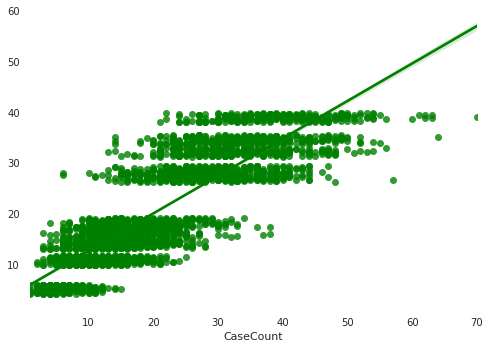

In [87]:
ax = sns.regplot(x=y_test, y=y_test_pred, color="g")

In [88]:
print("R2 Score: ",r2_score(y_test, y_test_pred))
print("MAE:", metrics.mean_absolute_error(y_test, y_test_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_test_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_pred)))                    

R2 Score:  0.7414336717278749
MAE: 4.629505206675096
MSE: 37.32170167055595
RMSE: 6.109149013615231


Why did I choose R-squared as the metric?


Because R-squared tells us how much of variance can be explained by the linear model.
R-squared is conveniently scaled between 0 and 1 and it can be compared with accuracy.
Better the model, higher the r2 value.
 

The model groups the days according to the district 12 times. This means 12 repetitions each day. This can cause data leakage. Therefore, we will do a more detailed study.

 <a id="section-3A3"></a>

# A.3.Model 2: Predict for each day for Ucr Part 3

In the previous model, we made an estimate for all Ucr_Parts. We are now customizing the model. Ucr_Part 3 is the Ucr part type with the highest number of crimes. Therefore, we will try to estimate how many crimes can be committed from Ucr_Part 3 in the future.

part1 : 0.42
part2: 0.57

Let's remember the Ucr Parts.

   Ucr_Parts  Incident_Number
0          0             1144
1          1            58735
2          2            90577
3          3           146117


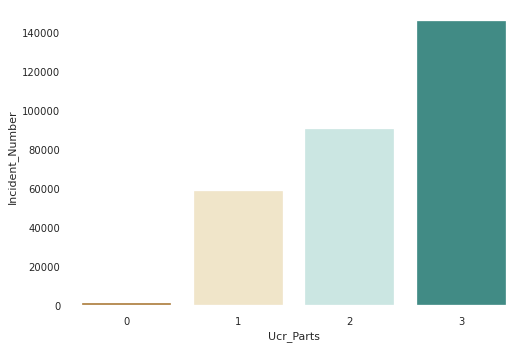

In [89]:
ucr_counts = data.groupby('Ucr_Parts').count()['Incident_Number'].to_frame().reset_index()
ax = sns.barplot(x = 'Ucr_Parts' , y="Incident_Number", data = ucr_counts,palette='BrBG')
print(ucr_counts)

In [90]:
data["District"].unique()

array(['B2', 'E18', 'C11', 'A1', 'D4', 'C6', 'B3', 'A15', 'D14', 'E13',
       'A7', 'E5'], dtype=object)

We will feed our model with the number of crimes happening in the districts.

In [91]:
dataD4 = data.loc[data['District'] == "D4"]
dataD4 = dataD4.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataD4 = pd.DataFrame(dataD4.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataD4.rename(columns={ 'Incident_Number': 'countD4','Occurred_On_Date': "DateD4"}, inplace=True)
dataD4 = dataD4.drop("District",axis = 1)

In [92]:
dataD14 = data.loc[data['District'] == "D14"]
dataD14 = dataD14.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataD14 = pd.DataFrame(dataD14.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataD14.rename(columns={ 'Incident_Number': 'countD14','Occurred_On_Date': "DateD14"}, inplace=True)
dataD14 = dataD14.drop("District",axis = 1)

In [93]:
dataC11 = data.loc[data['District'] == "C11"]
dataC11 = dataC11.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataC11 = pd.DataFrame(dataC11.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataC11.rename(columns={ 'Incident_Number': 'countC11','Occurred_On_Date': "DateC11"}, inplace=True)
dataC11 = dataC11.drop("District",axis = 1)

In [94]:
dataB3 = data.loc[data['District'] == "B3"]
dataB3 = dataB3.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataB3 = pd.DataFrame(dataB3.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataB3.rename(columns={ 'Incident_Number': 'countB3', 'Occurred_On_Date': "DateB3"}, inplace=True)
dataB3 = dataB3.drop("District",axis = 1)

In [95]:
dataB2 = data.loc[data['District'] == "B2"]
dataB2 = dataB2.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataB2 = pd.DataFrame(dataB2.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataB2.rename(columns={ 'Incident_Number': 'countB2','Occurred_On_Date': "DateB2"}, inplace=True)
dataB2 = dataB2.drop("District",axis = 1)

In [96]:
dataC6 = data.loc[data['District'] == "C6"]
dataC6 = dataC6.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataC6 = pd.DataFrame(dataC6.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataC6.rename(columns={ 'Incident_Number': 'countC6','Occurred_On_Date': "DateC6"}, inplace=True)
dataC6 = dataC6.drop("District",axis = 1)

In [97]:
dataA1 = data.loc[data['District'] == "A1"]
dataA1 = dataA1.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataA1 = pd.DataFrame(dataA1.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataA1.rename(columns={ 'Incident_Number': 'countA1','Occurred_On_Date': "DateA1"}, inplace=True)
dataA1 = dataA1.drop("District",axis = 1)

In [98]:
dataE5 = data.loc[data['District'] == "E5"]
dataE5 = dataE5.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataE5 = pd.DataFrame(dataE5.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataE5.rename(columns={ 'Incident_Number': 'countE5','Occurred_On_Date': "DateE5"}, inplace=True)
dataE5 = dataE5.drop("District",axis = 1)

In [99]:
dataA7 = data.loc[data['District'] == "A7"]
dataA7 = dataA7.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataA7 = pd.DataFrame(dataA7.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataA7.rename(columns={ 'Incident_Number': 'countA7','Occurred_On_Date': "DateA7"}, inplace=True)
dataA7 = dataA7.drop("District",axis = 1)

In [100]:
dataE13 = data.loc[data['District'] == "E13"]
dataE13 = dataE13.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataE13 = pd.DataFrame(dataE13.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataE13.rename(columns={ 'Incident_Number': 'countE13','Occurred_On_Date': "DateE13"}, inplace=True)
dataE13 = dataE13.drop("District",axis = 1)

In [101]:
dataE18 = data.loc[data['District'] == "E18"]
dataE18 = dataE18.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataE18 = pd.DataFrame(dataE18.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataE18.rename(columns={ 'Incident_Number': 'countE18', 'Occurred_On_Date': "DateE18"}, inplace=True)
dataE18 = dataE18.drop("District",axis = 1)

In [102]:
dataA15 = data.loc[data['District'] == "A15"]
dataA15 = dataA15.loc[:, ["Incident_Number",'Offense_Code_Group', 'District', 'Occurred_On_Date']]
dataA15 = pd.DataFrame(dataA15.groupby(["Occurred_On_Date","District"])["Incident_Number"].count()).reset_index()
dataA15.rename(columns={ 'Incident_Number': 'countA15','Occurred_On_Date': "DateA15"}, inplace=True)
dataA15 = dataA15.drop("District",axis = 1)

In [103]:
dataE18

,DateE18,countE18
0,2015-06-15,12
1,2015-06-16,21
2,2015-06-17,21
3,2015-06-18,15
4,2015-06-19,17
...,...,...
1172,2018-08-30,15
1173,2018-08-31,14
1174,2018-09-01,20
1175,2018-09-02,16


In [104]:
dataUCR = data.loc[data['Ucr_Parts'] == 3]
dataUCR = dataUCR.loc[:, ["Incident_Number", 'Ucr_Parts', 'Occurred_On_Date']]
dataUCR = pd.DataFrame(dataUCR.groupby(["Occurred_On_Date","Ucr_Parts"])["Incident_Number"].count()).reset_index()
dataUCR.rename(columns={ 'Incident_Number': 'countUCR','Occurred_On_Date': "DateUCR"}, inplace=True)
dataUCR = dataUCR.drop("Ucr_Parts",axis = 1)


In [105]:
dataUCR

,DateUCR,countUCR
0,2015-06-15,116
1,2015-06-16,108
2,2015-06-17,90
3,2015-06-18,141
4,2015-06-19,116
...,...,...
1172,2018-08-30,126
1173,2018-08-31,138
1174,2018-09-01,142
1175,2018-09-02,111


We get the daily crime numbers in each district and the crime numbers in Ucr_Part 3.

In [106]:
result = pd.concat([dataUCR,dataD14, dataC11, dataD4, dataB3,dataB2,dataC6, dataA1, dataE5, dataA7, dataE13,
       dataE18, dataA15], axis=1, sort=False)

In [107]:
result = result.drop(["DateUCR",'DateC11','DateD4', 'DateB3',  'DateB2','DateC6',  'DateA1', 'DateE5',  'DateA7',  'DateE13','DateE18',  'DateA15'] ,axis = 1)

In [108]:
result.isnull().sum()

countUCR     0
DateD14      0
countD14     0
countC11     0
countD4      0
countB3      0
countB2      0
countC6      0
countA1      0
countE5      0
countA7      0
countE13     0
countE18     0
countA15    15
dtype: int64

We have missing data in the A15 district. Let's fill this with average.

In [109]:
result["countA15"] = result["countA15"].fillna(result["countA15"].mean())

Let's add  DayofMonth, Month and Weekday features to our data. Maybe it will help.

In [110]:
result['DayofMonth'] = result['DateD14'].dt.day
result['Month'] = result['DateD14'].dt.month
result['Weekday'] = result['DateD14'].dt.weekday

In [111]:
result

,countUCR,DateD14,countD14,countC11,countD4,countB3,countB2,countC6,countA1,countE5,countA7,countE13,countE18,countA15,DayofMonth,Month,Weekday
0,116,2015-06-15,16,31,40,26,34,16,23,18,10,8,12,5.00000,15,6,0
1,108,2015-06-16,10,41,32,24,39,20,25,7,13,5,21,5.00000,16,6,1
2,90,2015-06-17,13,32,36,25,26,12,24,13,14,7,21,2.00000,17,6,2
3,141,2015-06-18,11,34,30,34,70,16,29,9,8,20,15,8.00000,18,6,3
4,116,2015-06-19,20,36,31,39,58,14,33,11,6,8,17,3.00000,19,6,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1172,126,2018-08-30,24,37,29,31,27,25,23,8,8,10,15,5.30895,30,8,3
1173,138,2018-08-31,27,34,22,21,43,25,16,15,11,21,14,5.30895,31,8,4
1174,142,2018-09-01,30,33,22,27,35,18,25,13,5,15,20,5.30895,1,9,5
1175,111,2018-09-02,17,44,16,21,29,16,17,9,7,10,16,5.30895,2,9,6


Check for null values.

In [112]:
result.isnull().sum()

countUCR      0
DateD14       0
countD14      0
countC11      0
countD4       0
countB3       0
countB2       0
countC6       0
countA1       0
countE5       0
countA7       0
countE13      0
countE18      0
countA15      0
DayofMonth    0
Month         0
Weekday       0
dtype: int64

And our final data for the model.

In [113]:
result

,countUCR,DateD14,countD14,countC11,countD4,countB3,countB2,countC6,countA1,countE5,countA7,countE13,countE18,countA15,DayofMonth,Month,Weekday
0,116,2015-06-15,16,31,40,26,34,16,23,18,10,8,12,5.00000,15,6,0
1,108,2015-06-16,10,41,32,24,39,20,25,7,13,5,21,5.00000,16,6,1
2,90,2015-06-17,13,32,36,25,26,12,24,13,14,7,21,2.00000,17,6,2
3,141,2015-06-18,11,34,30,34,70,16,29,9,8,20,15,8.00000,18,6,3
4,116,2015-06-19,20,36,31,39,58,14,33,11,6,8,17,3.00000,19,6,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1172,126,2018-08-30,24,37,29,31,27,25,23,8,8,10,15,5.30895,30,8,3
1173,138,2018-08-31,27,34,22,21,43,25,16,15,11,21,14,5.30895,31,8,4
1174,142,2018-09-01,30,33,22,27,35,18,25,13,5,15,20,5.30895,1,9,5
1175,111,2018-09-02,17,44,16,21,29,16,17,9,7,10,16,5.30895,2,9,6


In [114]:
result['DateD14'] = pd.to_datetime(result['DateD14'])
result['DateD14'] = result['DateD14'].map(dt.datetime.toordinal)

In [115]:
x_trainUCR, x_testUCR, y_trainUCR, y_testUCR = train_test_split(result.drop(columns=["countUCR"]), result["countUCR"], random_state = 42)  

In [116]:
lr = LinearRegression().fit(x_trainUCR,y_trainUCR)

y_train_predUCR = lr.predict(x_trainUCR)
y_test_predUCR = lr.predict(x_testUCR)

print(lr.score(x_testUCR,y_testUCR))

0.6659677025799691


In [117]:
print("R2 Score: ",r2_score(y_testUCR, y_test_predUCR))
print("MAE:", metrics.mean_absolute_error(y_testUCR, y_test_predUCR))
print('MSE:', metrics.mean_squared_error(y_testUCR, y_test_predUCR))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_testUCR, y_test_predUCR)))   

R2 Score:  0.6659677025799691
MAE: 8.773180449197001
MSE: 115.89887820834332
RMSE: 10.765634129411204


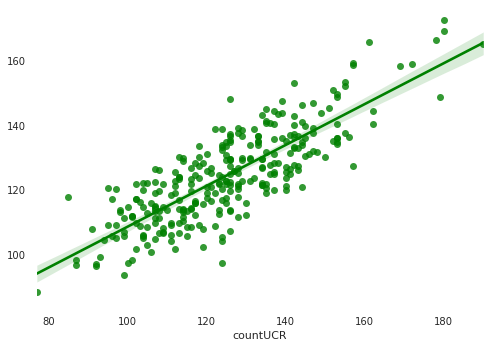

In [118]:
ax = sns.regplot(x=y_testUCR, y=y_test_predUCR, color="g")

<a id="section-3B"></a>
# Model 3: Predict district& location

Now, we want to predict the region. If we can predict in which region the crime will occur, the police can work by focusing on the regions.
It can help us plan and guide patrol cars. Patrol cars can route in busy places during peak hours.

In other words, it is important to predict in which district a crime may occur in order to prevent crime.

 <a id="section-3B1"></a>
# Prep for Model 3

It is important to take action where the crime may occur.
We will try to guess at which districts the crime that occurs in this model. We will be using XGB Classifier for its ease of use and predictive power.

We used the Offense_Code_Group, Year, Seasons, Hour, Shooting, DayOfWeek, Ucr_Parts, Lat, Long features in the first model to predict the districts. However, when we got 99% accuracy, we noticed that Lat and Long columns negatively affected our model. Let's examine.

In [119]:
dataD2 = data[['Offense_Code_Group', 'District',   'Year', 'Seasons', 'Hour', 'Shooting', 'DayOfWeek',"Ucr_Parts","Lat","Long"]]
dataD2['Offense_Code_Group'] = le.fit_transform(dataD2['Offense_Code_Group'])

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [120]:
X_train_xgb2, X_test_xgb2, y_train_xgb2, y_test_xgb2 = train_test_split(dataD2.drop(["District"], axis = 1), dataD2["District"], test_size=0.20, random_state=42)

In [121]:
scaler = StandardScaler()
scaler.fit(X_train_xgb2)
X_train = scaler.transform(X_train_xgb2)
X_test = scaler.transform(X_test_xgb2)

# Model 3

Let's build the model.

In [122]:
xgB2 = XGBClassifier(learning_rate=0.1, n_estimators=140, max_depth=5, random_state=0)
xgB2.fit(X_train_xgb2, y_train_xgb2)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=140, n_jobs=0, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [123]:
y_predXG2 = xgB2.predict(X_test_xgb2)
cmXG =confusion_matrix(y_test_xgb2, y_predXG2)
print(classification_report(y_test_xgb2, y_predXG2))

              precision    recall  f1-score   support

          A1       0.98      0.99      0.98      6520
         A15       0.98      0.99      0.99      1247
          A7       1.00      1.00      1.00      2651
          B2       0.99      0.98      0.98      9127
          B3       0.99      0.99      0.99      6785
         C11       0.99      0.99      0.99      8097
          C6       0.98      0.98      0.98      4333
         D14       0.99      0.99      0.99      3764
          D4       0.99      0.99      0.99      7562
         E13       0.98      0.99      0.98      3327
         E18       0.98      0.99      0.99      3332
          E5       0.99      0.99      0.99      2570

    accuracy                           0.99     59315
   macro avg       0.99      0.99      0.99     59315
weighted avg       0.99      0.99      0.99     59315



We gave the location values that make up our predicted value to the model. And our accuracy is 0.99.

**Feature Importance**

When we look at feature importance, we can see how much latitude and longitude values affect our estimation.

[Text(0, 0, 'Offense_Code_Group'),
 Text(0, 0, 'Year'),
 Text(0, 0, 'Seasons'),
 Text(0, 0, 'Hour'),
 Text(0, 0, 'Shooting'),
 Text(0, 0, 'DayOfWeek'),
 Text(0, 0, 'Ucr_Parts'),
 Text(0, 0, 'Lat'),
 Text(0, 0, 'Long')]

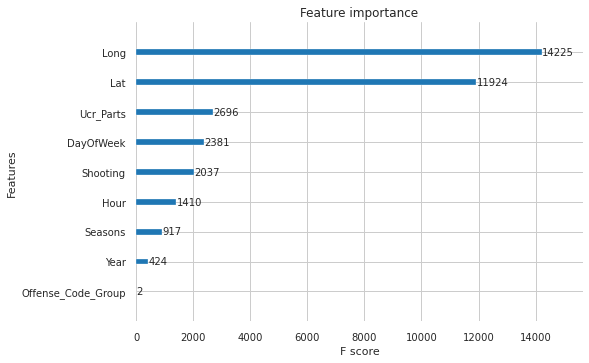

In [124]:
from xgboost import plot_importance
plot_importance(xgB2).set_yticklabels(["Offense_Code_Group","Year","Seasons","Hour","Shooting","DayOfWeek","Ucr_Parts","Lat","Long"])


* Accuracy is 0.99 because we gave the location while estimating the regions. Now we need to take the columns out of the model and try.

* We'll create the day of week column to increase the accuracy.

# Model 3 without Lat and Long

In [125]:
data['DayofMonth'] = data['Occurred_On_Date'].dt.day

In [126]:
data.columns

Index(['Incident_Number', 'Offense_Code', 'Offense_Code_Group',
       'Offense_Description', 'District', 'Reporting_Area', 'Shooting',
       'Occurred_On_Date', 'Year', 'Month', 'Day_Of_Week', 'Hour', 'Street',
       'Lat', 'Long', 'Location', 'Day', 'Night', 'DayOfWeek', 'Seasons',
       'Ucr_Parts', 'DayofMonth'],
      dtype='object')

In [127]:
dataD = data[['Offense_Code_Group', 'District',   'Year', 'Seasons', 'Hour', 'Shooting', 'DayOfWeek',"Ucr_Parts","DayofMonth","Night"]]

In [128]:
dataD["DayofMonth"].nunique()

31

In [129]:
dataD['Offense_Code_Group'] = le.fit_transform(dataD['Offense_Code_Group'])
# dataD['Reporting_Area'] = le.fit_transform(dataD['Reporting_Area'])     # Reporting areayı modele dahil edince 0.97 accuracy çıkıyor.
# dataD = data[['Offense_Code_Group', 'District',   'Year', 'Seasons', 'Hour', 'Shooting', 'DayOfWeek',"Ucr_Parts",'Year', 'Month', 'Night']]
# 'Year', 'Month', 'Night' columnlarını eklersek modelin accuracysi yine 0.20'de kalıyor. Değiştirmiyor.

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [130]:
data.columns

Index(['Incident_Number', 'Offense_Code', 'Offense_Code_Group',
       'Offense_Description', 'District', 'Reporting_Area', 'Shooting',
       'Occurred_On_Date', 'Year', 'Month', 'Day_Of_Week', 'Hour', 'Street',
       'Lat', 'Long', 'Location', 'Day', 'Night', 'DayOfWeek', 'Seasons',
       'Ucr_Parts', 'DayofMonth'],
      dtype='object')

In [131]:
dataD

,Offense_Code_Group,District,Year,Seasons,Hour,Shooting,DayOfWeek,Ucr_Parts,DayofMonth,Night
149,36,B2,2018,0,9,0,1,3,3,0
137,58,E18,2018,0,10,0,1,3,3,0
127,24,C11,2018,0,11,0,1,2,3,0
128,60,C11,2018,0,11,0,1,3,3,0
129,27,A1,2018,0,11,0,1,3,3,0
...,...,...,...,...,...,...,...,...,...,...
318627,58,D4,2015,2,10,0,1,3,15,0
318626,31,D4,2015,2,0,0,1,1,15,1
318625,60,D4,2015,2,12,0,1,3,15,0
318624,28,B2,2015,2,12,0,1,3,15,0


In [132]:
X_train, X_test, y_train, y_test = train_test_split(dataD.drop(["District"], axis = 1), dataD["District"], test_size=0.20, random_state=42)

In [133]:
# from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

Let's try our model without latitude and longitude values.

In [134]:
# from xgboost import XGBClassifier

xgB = XGBClassifier(learning_rate=0.1, n_estimators=140, max_depth=5, random_state=0)
xgB.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=140, n_jobs=0, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [135]:
# from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, classification_report

y_predXG = xgB.predict(X_test)
cmXG =confusion_matrix(y_test, y_predXG)
print(classification_report(y_test, y_predXG))

/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



              precision    recall  f1-score   support

          A1       0.23      0.23      0.23      6520
         A15       0.00      0.00      0.00      1247
          A7       0.50      0.00      0.00      2651
          B2       0.18      0.51      0.27      9127
          B3       0.23      0.13      0.17      6785
         C11       0.18      0.22      0.20      8097
          C6       0.21      0.03      0.05      4333
         D14       0.20      0.02      0.04      3764
          D4       0.23      0.35      0.27      7562
         E13       0.05      0.00      0.00      3327
         E18       0.35      0.01      0.01      3332
          E5       0.29      0.00      0.01      2570

    accuracy                           0.20     59315
   macro avg       0.22      0.13      0.10     59315
weighted avg       0.22      0.20      0.15     59315



**Feature Importance**

[Text(0, 0, 'Offense_Code_Group'),
 Text(0, 0, 'Year'),
 Text(0, 0, 'Seasons'),
 Text(0, 0, 'Hour'),
 Text(0, 0, 'Shooting'),
 Text(0, 0, 'DayOfWeek'),
 Text(0, 0, 'Ucr_Parts'),
 Text(0, 0, 'DayofMonth'),
 Text(0, 0, 'Night')]

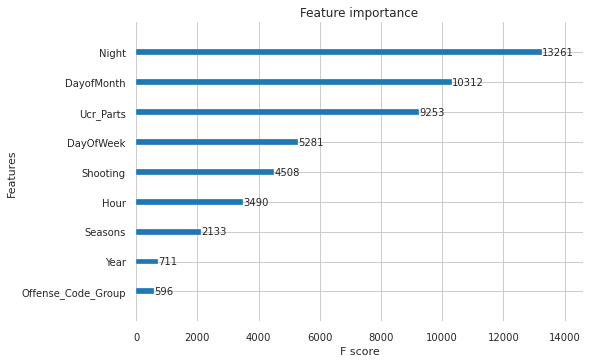

In [136]:
# Feature Importance ile sonucumuza en çok katkı sağlayan featureları görebiliriz. Gelecekteki modelleri buna göre kurabiliriz.
plot_importance(xgB).set_yticklabels(["Offense_Code_Group","Year","Seasons","Hour","Shooting","DayOfWeek","Ucr_Parts","DayofMonth","Night"])

While predicting the districts, our model was not successful enough. The reasons for this may be the following.

* Districts are close to each other and have no clear boundaries.
* We have a large number of districts.
* We don't have enough data.

For this reason, we will try to model the districts by grouping them among themselves. So I aim for better prediction.

# Model 3 with Grouped Districts

In [137]:
dataD = data[['Offense_Code_Group', 'District',   'Year', 'Seasons', 'Hour', 'Shooting', 'DayOfWeek',"Ucr_Parts","DayofMonth","Night"]]

In [138]:
dataD

,Offense_Code_Group,District,Year,Seasons,Hour,Shooting,DayOfWeek,Ucr_Parts,DayofMonth,Night
149,Medical Assistance,B2,2018,0,9,0,1,3,3,0
137,Towed,E18,2018,0,10,0,1,3,3,0
127,Harassment,C11,2018,0,11,0,1,2,3,0
128,Verbal Disputes,C11,2018,0,11,0,1,3,3,0
129,Investigate Person,A1,2018,0,11,0,1,3,3,0
...,...,...,...,...,...,...,...,...,...,...
318627,Towed,D4,2015,2,10,0,1,3,15,0
318626,Larceny From Motor Vehicle,D4,2015,2,0,0,1,1,15,1
318625,Verbal Disputes,D4,2015,2,12,0,1,3,15,0
318624,Investigate Property,B2,2015,2,12,0,1,3,15,0


In [139]:
dataD3 = data[['Offense_Code_Group','District', 'Year', 'Seasons', 'Hour', 'Shooting', 'DayOfWeek',"Ucr_Parts","DayofMonth","Night"]]

In [140]:
dataD3['Offense_Code_Group'] = le.fit_transform(dataD3['Offense_Code_Group'])

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



![Districts](https://i.pinimg.com/originals/73/00/d7/7300d79ca2fed818119719fba67d9a50.jpg)

Let's remember how the districts are distributed within the city.

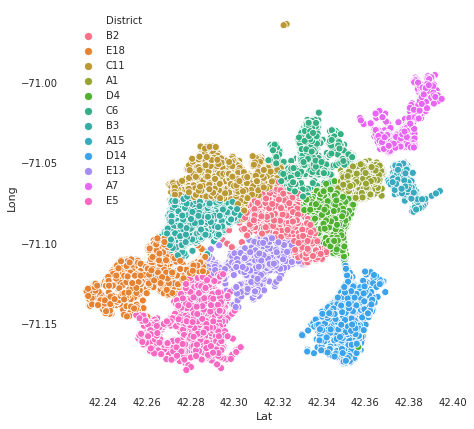

In [141]:
plt.figure(figsize=(7,7))
sp = data[(data['Lat'] != -1) & (data['Long'] != -1)]
sns.scatterplot(x="Lat", y="Long",hue='District',data=sp)

# for d name https://mikethemadbiologist.com/2013/06/29/why-are-bostons-police-districts-named-so-bizarrely/

We divided the districts into 3 groups according to their proximity.

In [142]:
dataD3["District"] = dataD3["District"].map({
    
    "E18":1,
    "E5":1,
    "E13":1,
    "B3":1,
    
    "D4":2,
    "B2":2,
    "C11":2,
    "C6":2,
    
    "A15":3,
    "A1":3,
    "A7":3,
    "D14":3,
    
})                         # 3 gruba ayırınca %49 accuracy çıkıyor.

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [143]:
"""dataD3["District"] = dataD3["District"].map({
    "B2":3,
    "E18":2,
    "C11":3,
    "A1":1,
    "D4":4,
    "C6":4,
    "B3":2,
    "A15":1,
    "D14":4,
    "E13":3,
    "A7":1,
    "E5":2,
    
})"""      
# acccuracy 0.38

'dataD3["District"] = dataD3["District"].map({\n    "B2":3,\n    "E18":2,\n    "C11":3,\n    "A1":1,\n    "D4":4,\n    "C6":4,\n    "B3":2,\n    "A15":1,\n    "D14":4,\n    "E13":3,\n    "A7":1,\n    "E5":2,\n    \n})'

This time in our dataset we have Hour, Ucr_Part,Offense_Code_Group,Shooting,... columns. 

We will try to classify the district groups.

In [144]:
dataD3

,Offense_Code_Group,District,Year,Seasons,Hour,Shooting,DayOfWeek,Ucr_Parts,DayofMonth,Night
149,36,2,2018,0,9,0,1,3,3,0
137,58,1,2018,0,10,0,1,3,3,0
127,24,2,2018,0,11,0,1,2,3,0
128,60,2,2018,0,11,0,1,3,3,0
129,27,3,2018,0,11,0,1,3,3,0
...,...,...,...,...,...,...,...,...,...,...
318627,58,2,2015,2,10,0,1,3,15,0
318626,31,2,2015,2,0,0,1,1,15,1
318625,60,2,2015,2,12,0,1,3,15,0
318624,28,2,2015,2,12,0,1,3,15,0


In [145]:
X_train_xgb3, X_test_xgb3, y_train_xgb3, y_test_xgb3 = train_test_split(dataD3.drop(["District"], axis = 1), dataD3["District"], test_size=0.20, random_state=42)

In [146]:
scaler = StandardScaler()
scaler.fit(X_train_xgb3)
X_train = scaler.transform(X_train_xgb3)
X_test = scaler.transform(X_test_xgb3)

In [147]:
xgB3 = XGBClassifier(learning_rate=0.1, n_estimators=50, max_depth=5, random_state=0)
xgB3.fit(X_train_xgb3, y_train_xgb3)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=50, n_jobs=0, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [148]:
y_predXG3 = xgB3.predict(X_test_xgb3)
cmXG3 =confusion_matrix(y_test_xgb3, y_predXG3)
print(classification_report(y_test_xgb3, y_predXG3))

              precision    recall  f1-score   support

           1       0.58      0.00      0.01     16014
           2       0.49      0.99      0.66     29119
           3       0.53      0.02      0.04     14182

    accuracy                           0.49     59315
   macro avg       0.54      0.34      0.23     59315
weighted avg       0.53      0.49      0.33     59315



[Text(0, 0, 'Offense_Code_Group'),
 Text(0, 0, 'Year'),
 Text(0, 0, 'Seasons'),
 Text(0, 0, 'Hour'),
 Text(0, 0, 'Shooting'),
 Text(0, 0, 'DayOfWeek'),
 Text(0, 0, 'Ucr_Parts'),
 Text(0, 0, 'DayofMonth'),
 Text(0, 0, 'Night')]

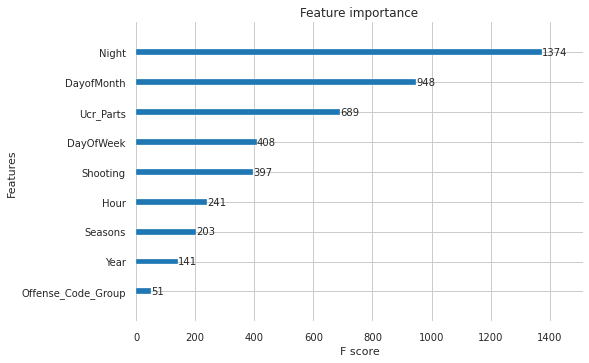

In [149]:
plot_importance(xgB3).set_yticklabels(["Offense_Code_Group","Year","Seasons","Hour","Shooting","DayOfWeek","Ucr_Parts","DayofMonth","Night"])

![Boston](https://images.unsplash.com/photo-1501979376754-2ff867a4f659?ixlib=rb-1.2.1&auto=format&fit=crop&w=1350&q=80)